# Analyzing and extracting texture features from slab data

In [1]:
# Imports

!pip install tqdm
!pip install ipympl


import os
import matplotlib.pyplot as plt
import numpy as np
import csv
import pandas as pd
from PIL import Image
from tqdm import tqdm
from skimage.feature import local_binary_pattern
from skimage.color import rgb2gray
from skimage import exposure, util, io
from skimage.filters import gaussian

%matplotlib widget

## Data Analysis
### Unreplaced Slabs

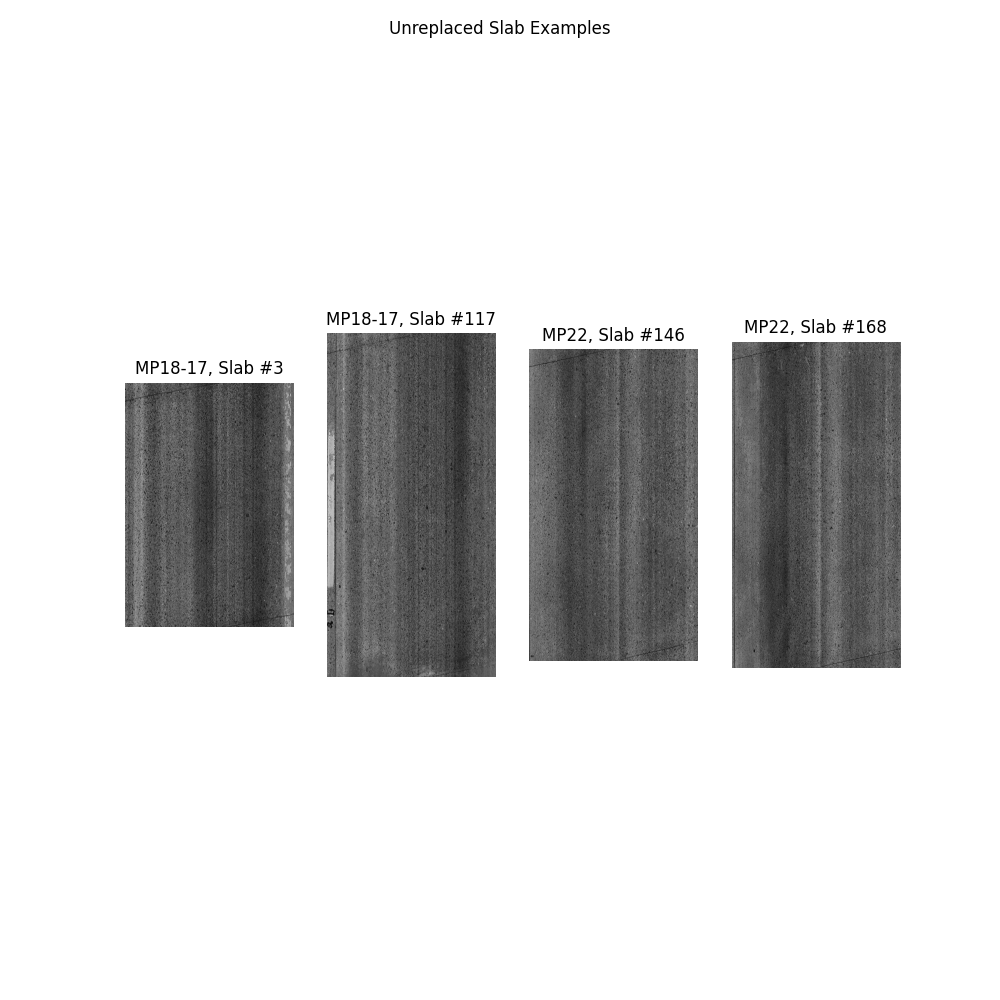

In [2]:
figsize = (10, 10)

f, ax = plt.subplots(1,4, sharey=False, figsize=figsize)

f.suptitle("Unreplaced Slab Examples")
unreplaced_18_1 = plt.imread(os.path.join("..", "Data", "MP18-17", "Slabs", "3.png"))
unreplaced_18_2 = plt.imread(os.path.join("..", "Data", "MP18-17", "Slabs", "117.png"))
unreplaced_22_1 = plt.imread(os.path.join("..", "Data", "MP22", "Slabs", "146.png"))
unreplaced_22_2 = plt.imread(os.path.join("..", "Data", "MP22", "Slabs", "168.png"))

ax[0].imshow(unreplaced_18_1)
ax[0].set_title("MP18-17, Slab #3")
ax[1].imshow(unreplaced_18_2)
ax[1].set_title("MP18-17, Slab #117")
ax[2].imshow(unreplaced_22_1)
ax[2].set_title("MP22, Slab #146")
ax[3].imshow(unreplaced_22_2)
ax[3].set_title("MP22, Slab #168")

for ax_i in ax:
    ax_i.set_frame_on(False)
    ax_i.set_axis_off()

### Replaced Slabs

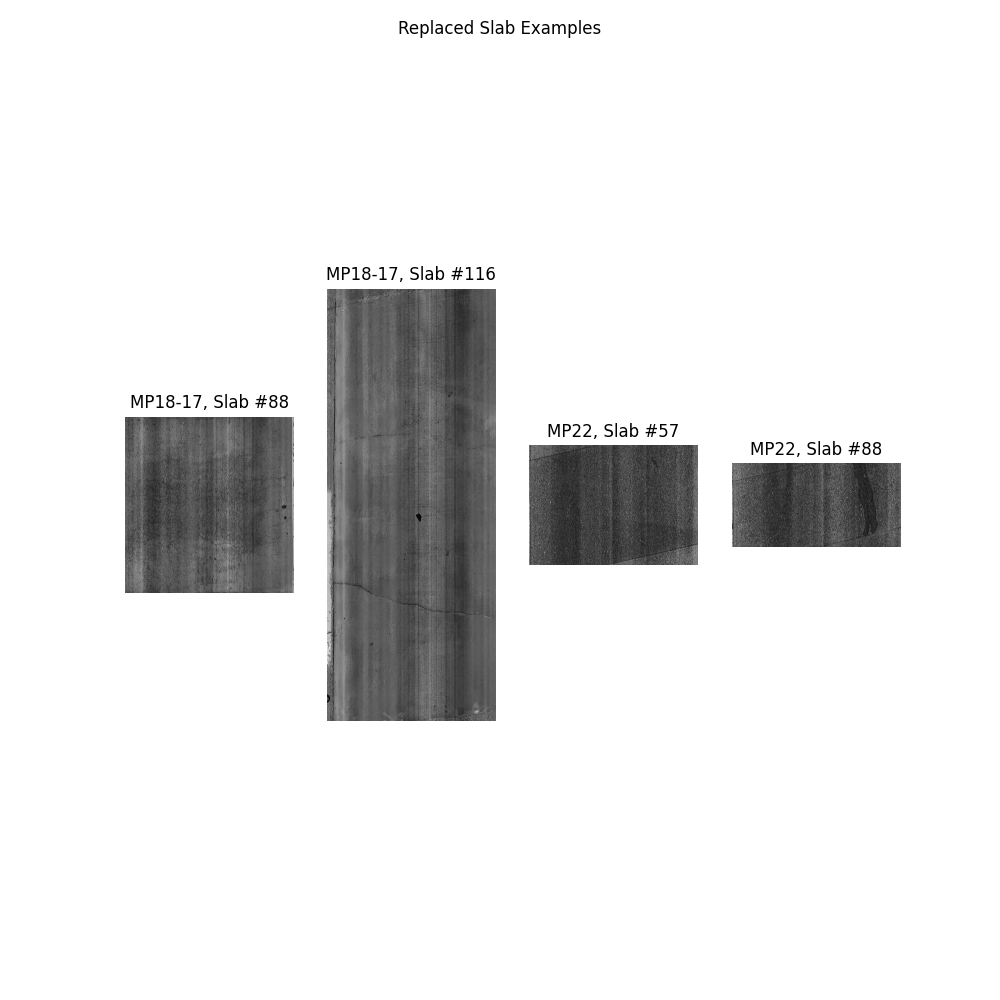

In [3]:
f, ax = plt.subplots(1,4, sharey=False, figsize=figsize)

f.suptitle("Replaced Slab Examples")
replaced_18_1 = plt.imread(os.path.join("..", "Data", "MP18-17", "Slabs", "88.png"))
replaced_18_2 = plt.imread(os.path.join("..", "Data", "MP18-17", "Slabs", "116.png"))
replaced_22_1 = plt.imread(os.path.join("..", "Data", "MP22", "Slabs", "57.png"))
replaced_22_2 = plt.imread(os.path.join("..", "Data", "MP22", "Slabs", "88.png"))

ax[0].imshow(replaced_18_1)
ax[0].set_title("MP18-17, Slab #88")
ax[1].imshow(replaced_18_2)
ax[1].set_title("MP18-17, Slab #116")
ax[2].imshow(replaced_22_1)
ax[2].set_title("MP22, Slab #57")
ax[3].imshow(replaced_22_2)
ax[3].set_title("MP22, Slab #88")

for ax_i in ax:
    ax_i.set_frame_on(False)
    ax_i.set_axis_off()

In [4]:
unreplaced_lengths = []
replaced_lengths = []

with open(os.path.join("..", "Data", "MP18-17", "ground-truths.csv"), "r") as mp1817:
    reader = csv.reader(mp1817)
    reader.__next__()
    for slab, is_replaced in reader:
        if is_replaced == "-1":
            continue
            
        im = Image.open(os.path.join("..", "Data", "MP18-17", "Slabs", f"{slab}.png"))
        size = im.size[1]
        if is_replaced == "0":
            unreplaced_lengths.append(size)
        else:
            replaced_lengths.append(size)
            
with open(os.path.join("..", "Data", "MP22", "ground-truths.csv"), "r") as mp22:
    reader = csv.reader(mp22)
    reader.__next__()
    for slab, is_replaced in reader:
        if is_replaced == "-1":
            continue
            
        im = Image.open(os.path.join("..", "Data", "MP22", "Slabs", f"{slab}.png"))
        size = im.size[1]
        if is_replaced == "0":
            unreplaced_lengths.append(size)
        else:
            replaced_lengths.append(size)

with open(os.path.join("..", "Data", "MP22-12_19", "ground-truths.csv"), "r") as mp22:
    reader = csv.reader(mp22)
    reader.__next__()
    for slab, is_replaced in reader:
        if is_replaced == "-1":
            continue
            
        im = Image.open(os.path.join("..", "Data", "MP22-12_19", "Slabs", f"{slab}.png"))
        size = im.size[1]
        if is_replaced == "0":
            unreplaced_lengths.append(size)
        else:
            replaced_lengths.append(size)

In [5]:
pd.DataFrame(unreplaced_lengths).describe()

,0
count,822.000000
mean,5691.763990
std,1226.204166
min,1854.000000
25%,4920.500000
50%,5344.000000
75%,6789.000000
max,12484.000000


In [6]:
pd.DataFrame(replaced_lengths).describe()

,0
count,205.000000
mean,3044.941463
std,1115.655754
min,1328.000000
25%,2292.000000
50%,2957.000000
75%,3594.000000
max,10657.000000


Text(0.5, 1.0, 'Replaced Lengths')

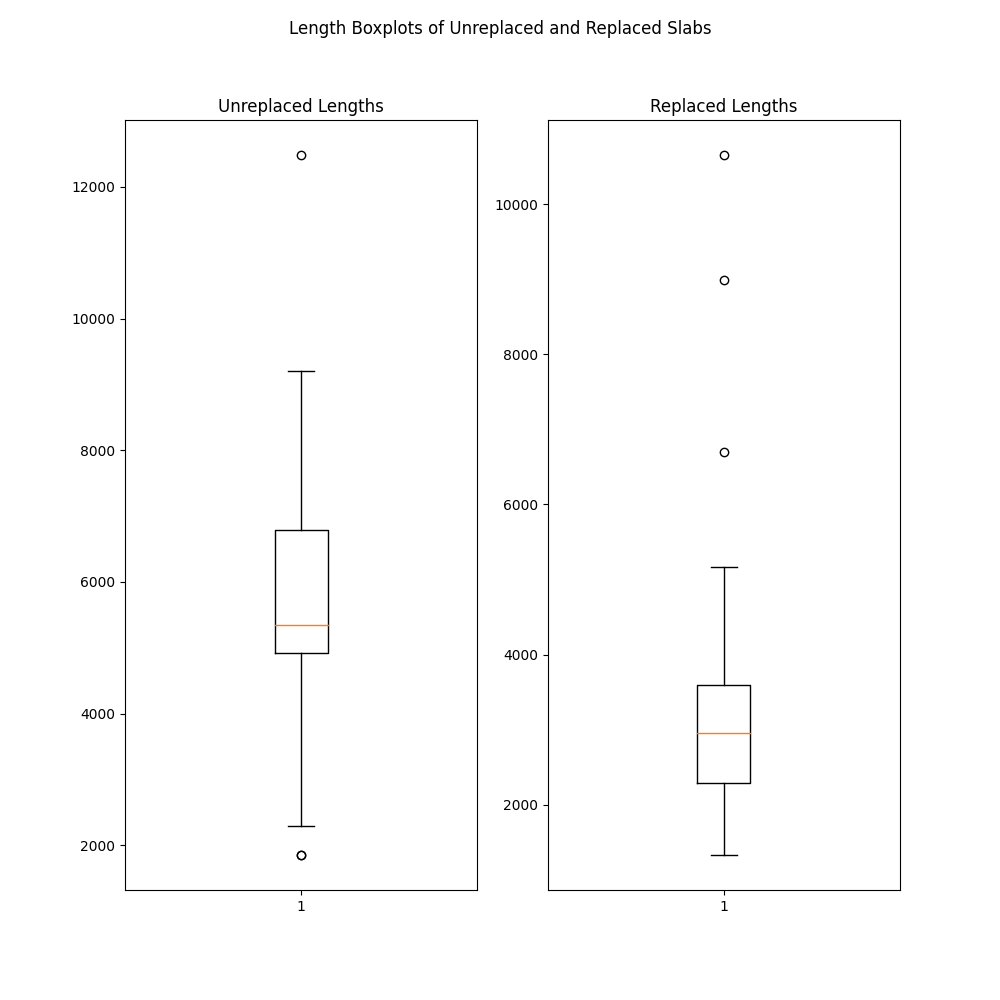

In [8]:
f, ax = plt.subplots(1,2, sharey=False, figsize=figsize)
f.suptitle("Length Boxplots of Unreplaced and Replaced Slabs")

ax[0].boxplot(unreplaced_lengths)
ax[0].set_title("Unreplaced Lengths")
ax[1].boxplot(replaced_lengths)
ax[1].set_title("Replaced Lengths")

### Overall observations and comparisons between unreplaced and replaced slabs
- Unreplaced slabs are relatively consistent in length and have consistent texture
- Replaced slabs are typically smaller length-wise than unreplaced slabs, but not always (see slab #116)
- Replaced slabs have different textures from unreplaced slabs, but can vary between smooth-looking slabs (#116) and darker-looking road slabs (#57) 
- For partial slab replacement, half of replacement will be replaced; half will be unreplaced

## Image Processing

### Local binary pattern: https://www.pyimagesearch.com/2015/12/07/local-binary-patterns-with-python-opencv/
Uniform LBP with rotational invariance.

Todo: refer to Ojala et. al paper in report

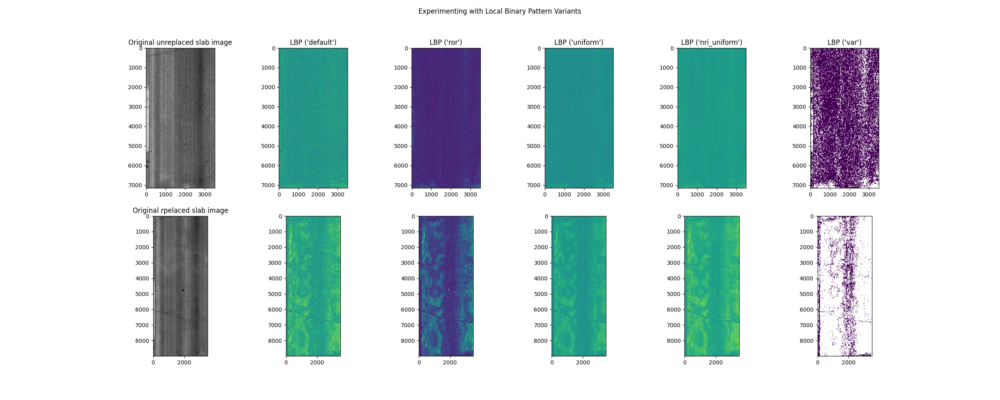

In [7]:
figsize = (25, 10)
unreplaced = rgb2gray(unreplaced_18_2)
replaced = rgb2gray(replaced_18_2)

f, ax = plt.subplots(2, 6, figsize=figsize)
f.suptitle("Experimenting with Local Binary Pattern Variants")

ax[0,0].imshow(unreplaced, cmap='gray')
ax[0,0].set_title("Original unreplaced slab image")

ax[1,0].imshow(replaced, cmap='gray')
ax[1,0].set_title("Original rpelaced slab image")

ax[0,1].set_title("LBP ('default')")
ax[0,1].imshow(local_binary_pattern(unreplaced, 8, 1, method='default'))
ax[1,1].imshow(local_binary_pattern(replaced, 8, 1, method='default'))

ax[0,2].set_title("LBP ('ror')")
ax[0,2].imshow(local_binary_pattern(unreplaced, 8, 1, method='ror'))
ax[1,2].imshow(local_binary_pattern(replaced, 8, 1, method='ror'))

ax[0,3].set_title("LBP ('uniform')")
ax[0,3].imshow(local_binary_pattern(unreplaced, 8, 1, method='uniform'))
ax[1,3].imshow(local_binary_pattern(replaced, 8, 1, method='uniform'))

ax[0,4].set_title("LBP ('nri_uniform')")
ax[0,4].imshow(local_binary_pattern(unreplaced, 8, 1, method='nri_uniform'))
ax[1,4].imshow(local_binary_pattern(replaced, 8, 1, method='nri_uniform'))

ax[0,5].set_title("LBP ('var')")
ax[0,5].imshow(local_binary_pattern(unreplaced, 8, 1, method='var'))
ax[1,5].imshow(local_binary_pattern(replaced, 8, 1, method='var'))

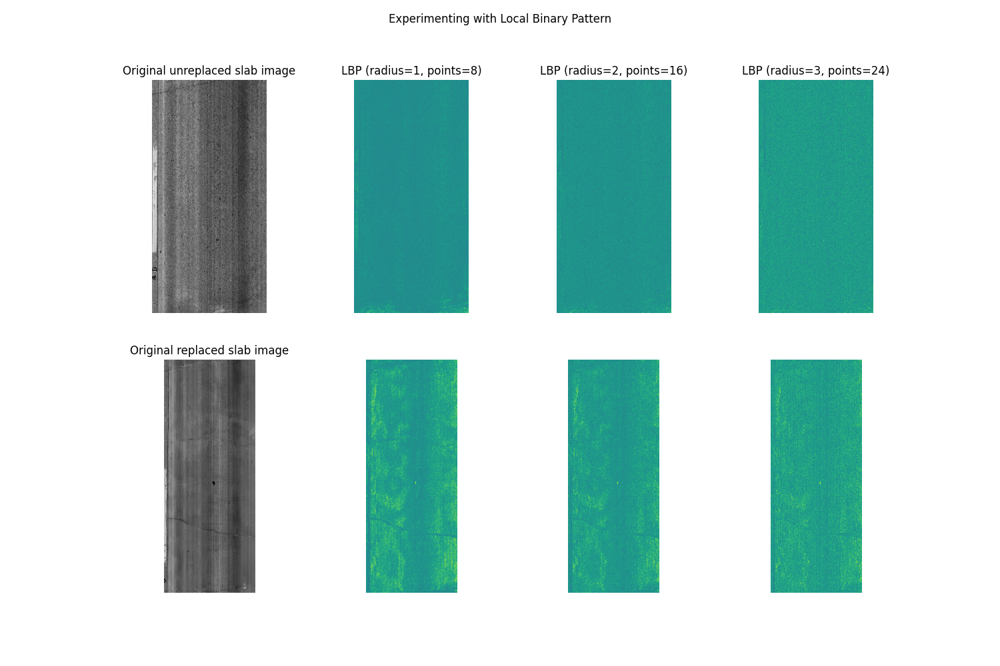

In [19]:
figsize = (15, 10)


f, ax = plt.subplots(2,4, figsize=figsize)
f.suptitle("Experimenting with Local Binary Pattern")

ax[0,0].imshow(unreplaced, cmap='gray')
ax[0,0].set_title("Original unreplaced slab image")

ax[1,0].imshow(replaced, cmap='gray')
ax[1,0].set_title("Original replaced slab image")

for i in range(1,4):
    ax[0,i].set_title(f"LBP (radius={i}, points={i*8})")
    ax[0,i].imshow(local_binary_pattern(unreplaced, i * 8, i, method="uniform"))
    ax[1,i].imshow(local_binary_pattern(replaced, i * 8, i, method="uniform"))

for ax_i in ax.flatten():
    ax_i.set_frame_on(False)
    ax_i.set_axis_off()


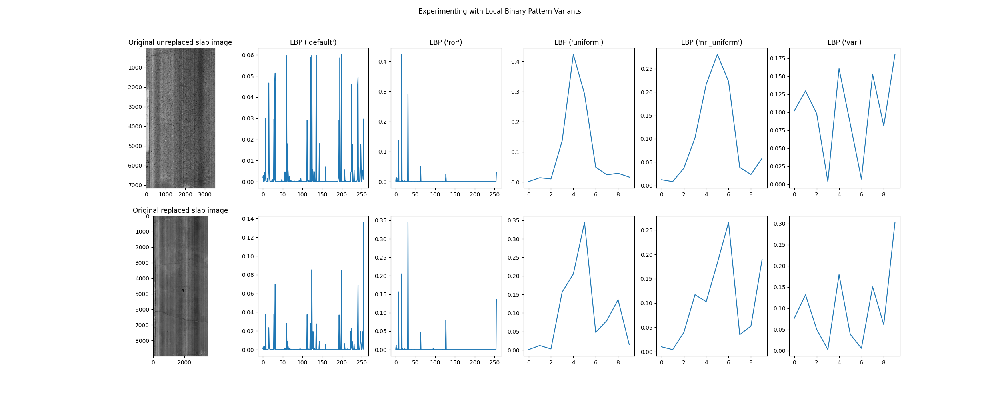

In [11]:
figsize = (25, 10)
# unreplaced = rgb2gray(unreplaced_18_2)
# replaced = rgb2gray(replaced_18_2)

f, ax = plt.subplots(2, 6, figsize=figsize)
f.suptitle("Experimenting with Local Binary Pattern Variants")

ax[0,0].imshow(unreplaced, cmap='gray')
ax[0,0].set_title("Original unreplaced slab image")

ax[1,0].imshow(replaced, cmap='gray')
ax[1,0].set_title("Original replaced slab image")

ax[0,1].set_title("LBP ('default')")
d_un, _ = np.histogram(local_binary_pattern(unreplaced, 8, 1, method='default').ravel(), bins=256)
d_re, _ = np.histogram(local_binary_pattern(replaced, 8, 1, method='default').ravel(), bins=256)
ax[0,1].plot((d_un.astype("float") / np.sum(d_un)))
ax[1,1].plot((d_re.astype("float") / np.sum(d_re)))

ax[0,2].set_title("LBP ('ror')")
r_un, _ = np.histogram(local_binary_pattern(unreplaced, 8, 1, method='ror').ravel(), bins=256)
r_re, _ = np.histogram(local_binary_pattern(replaced, 8, 1, method='ror').ravel(), bins=256)
ax[0,2].plot((r_un.astype("float") / np.sum(r_un)))
ax[1,2].plot((r_re.astype("float") / np.sum(r_re)))

ax[0,3].set_title("LBP ('uniform')")
u_un, _ = np.histogram(local_binary_pattern(unreplaced, 8, 1, method='uniform').ravel(), bins=10)
u_re, _ = np.histogram(local_binary_pattern(replaced, 8, 1, method='uniform').ravel(), bins=10)
ax[0,3].plot((u_un.astype("float") / np.sum(u_un)))
ax[1,3].plot((u_re.astype("float") / np.sum(u_re)))

ax[0,4].set_title("LBP ('nri_uniform')")
n_un, _ = np.histogram(local_binary_pattern(unreplaced, 8, 1, method='nri_uniform').ravel(), bins=10)
n_re, _ = np.histogram(local_binary_pattern(replaced, 8, 1, method='nri_uniform').ravel(), bins=10)
ax[0,4].plot((n_un.astype("float") / np.sum(n_un)))
ax[1,4].plot((n_re.astype("float") / np.sum(n_re)))

ax[0,5].set_title("LBP ('var')")
v_un, _ = np.histogram(local_binary_pattern(unreplaced, 8, 1, method='default').ravel(), bins=10)
v_re, _ = np.histogram(local_binary_pattern(replaced, 8, 1, method='default').ravel(), bins=10)
ax[0,5].plot((v_un.astype("float") / np.sum(v_un)))
ax[1,5].plot((v_re.astype("float") / np.sum(v_re)))

In [9]:
len(d_un)

10

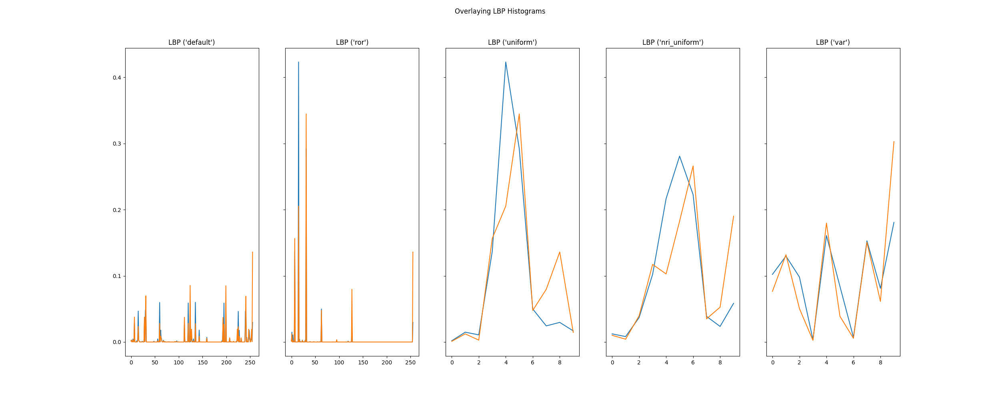

In [12]:
f, ax = plt.subplots(1, 5, sharey=True, figsize=figsize)
f.suptitle("Overlaying LBP Histograms")

ax[0].set_title("LBP ('default')")
ax[0].plot((d_un.astype("float") / np.sum(d_un)), label="Unreplaced")
ax[0].plot((d_re.astype("float") / np.sum(d_re)), label="Replaced")

ax[1].set_title("LBP ('ror')")
ax[1].plot((r_un.astype("float") / np.sum(r_un)), label="Unreplaced")
ax[1].plot((r_re.astype("float") / np.sum(r_re)), label="Replaced")

ax[2].set_title("LBP ('uniform')")
ax[2].plot((u_un.astype("float") / np.sum(u_un)), label="Unreplaced")
ax[2].plot((u_re.astype("float") / np.sum(u_re)), label="Replaced")

ax[3].set_title("LBP ('nri_uniform')")
ax[3].plot((n_un.astype("float") / np.sum(n_un)), label="Unreplaced")
ax[3].plot((n_re.astype("float") / np.sum(n_re)), label="Replaced")

ax[4].set_title("LBP ('var')")
ax[4].plot((v_un.astype("float") / np.sum(v_un)), label="Unreplaced")
ax[4].plot((v_re.astype("float") / np.sum(v_re)), label="Replaced")

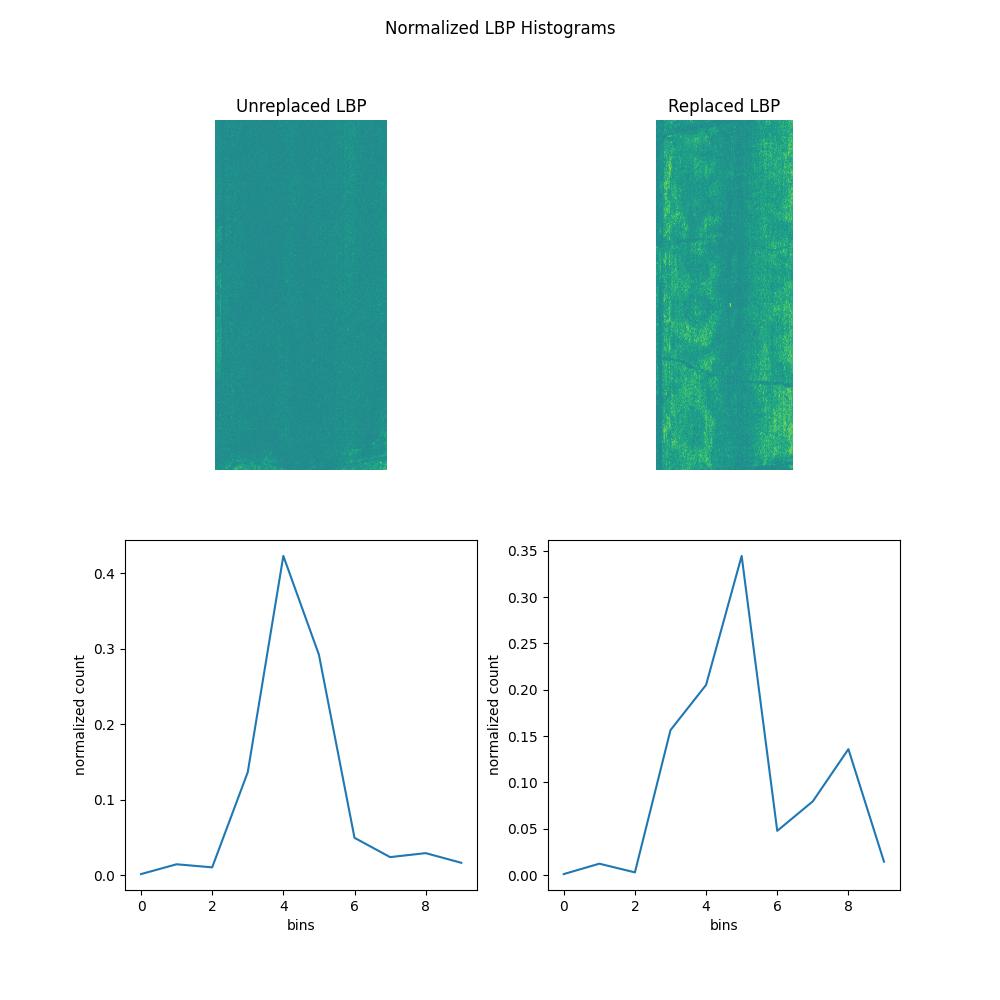

In [23]:
unreplaced_lbp_ex = local_binary_pattern(unreplaced, 8, 1, "uniform")
replaced_lbp_ex = local_binary_pattern(replaced, 8, 1, "uniform")

# Uniform LBP with rotational invariance.
# num_points + 1 uniform patterns; final histogram dimensionality is num_points + 2
# https://www.pyimagesearch.com/2015/12/07/local-binary-patterns-with-python-opencv/
# todo refer to Ojala et. al paper in report

lbp_hist_un, bin_arr_un = np.histogram(unreplaced_lbp_ex.ravel())
lbp_hist_re, bin_arr_re = np.histogram(replaced_lbp_ex.ravel())

lbp_hist_un = lbp_hist_un.astype("float") / np.sum(lbp_hist_un)
lbp_hist_re = lbp_hist_re.astype("float") / np.sum(lbp_hist_re)

figsize = (10, 10)
f, ax = plt.subplots(2, 2, figsize=figsize)
f.suptitle("Normalized LBP Histograms")
ax[0,0].set_title("Unreplaced LBP")
ax[0,0].imshow(unreplaced_lbp_ex)
ax[0,1].set_title("Replaced LBP")
ax[0,1].imshow(replaced_lbp_ex)

ax[1,0].plot(lbp_hist_un)
ax[1,0].set_xlabel("bins")
ax[1,0].set_ylabel("normalized count")
ax[1,1].plot(lbp_hist_re)
ax[1,1].set_xlabel("bins")
ax[1,1].set_ylabel("normalized count")

for ax_i in ax[0,:]:
    ax_i.set_frame_on(False)
    ax_i.set_axis_off()

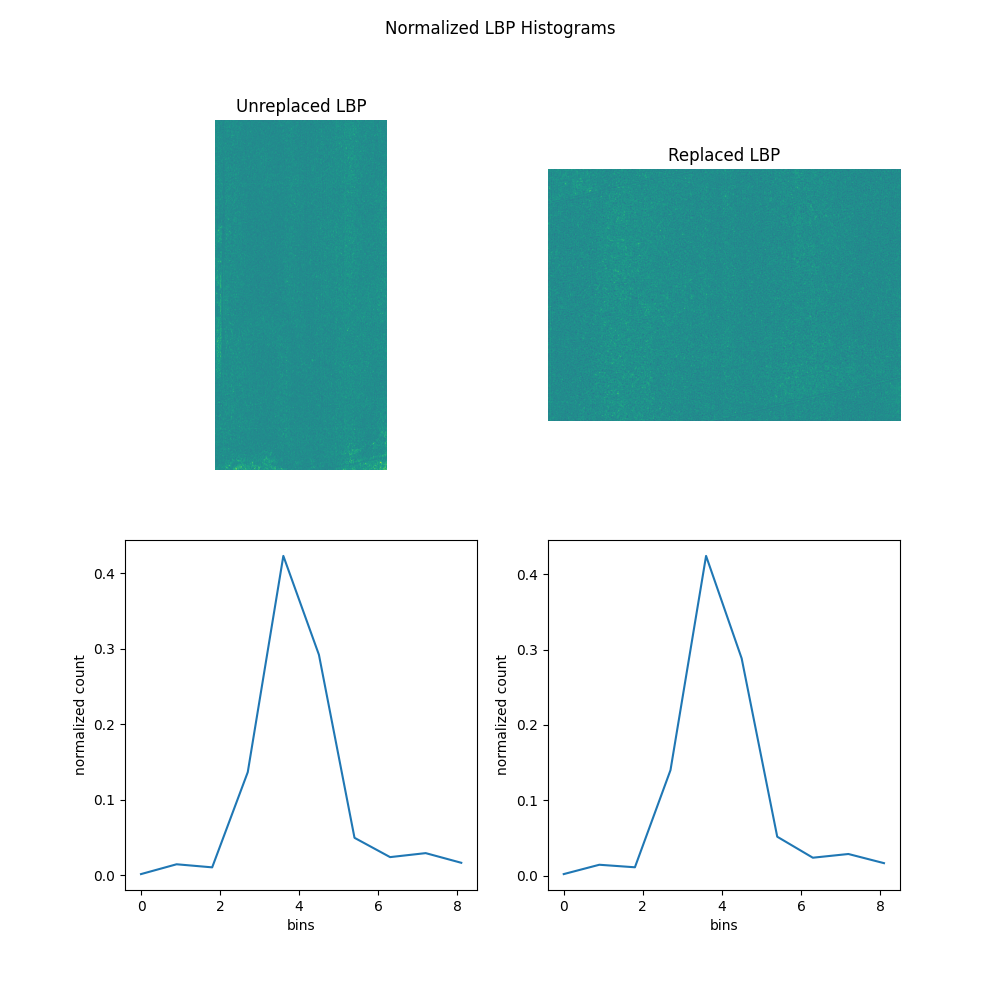

In [12]:
replaced = rgb2gray(replaced_22_1)
replaced_57 = replaced

unreplaced_lbp_ex = local_binary_pattern(unreplaced, 8, 1, "uniform")
replaced_lbp_ex = local_binary_pattern(replaced, 8, 1, "uniform")

lbp_hist_un, bin_arr_un = np.histogram(unreplaced_lbp_ex.ravel())
lbp_hist_re, bin_arr_re = np.histogram(replaced_lbp_ex.ravel())

lbp_hist_un = lbp_hist_un.astype("float") / np.sum(lbp_hist_un)
lbp_hist_re = lbp_hist_re.astype("float") / np.sum(lbp_hist_re)

figsize = (10, 10)
f, ax = plt.subplots(2, 2, figsize=figsize)
f.suptitle("Normalized LBP Histograms")
ax[0,0].set_title("Unreplaced LBP")
ax[0,0].imshow(unreplaced_lbp_ex)
ax[0,1].set_title("Replaced LBP")
ax[0,1].imshow(replaced_lbp_ex)

ax[1,0].plot(bin_arr_un[:-1], lbp_hist_un)
ax[1,0].set_xlabel("bins")
ax[1,0].set_ylabel("normalized count")
ax[1,1].plot(bin_arr_re[:-1], lbp_hist_re)
ax[1,1].set_xlabel("bins")
ax[1,1].set_ylabel("normalized count")

for ax_i in ax[0,:]:
    ax_i.set_frame_on(False)
    ax_i.set_axis_off()

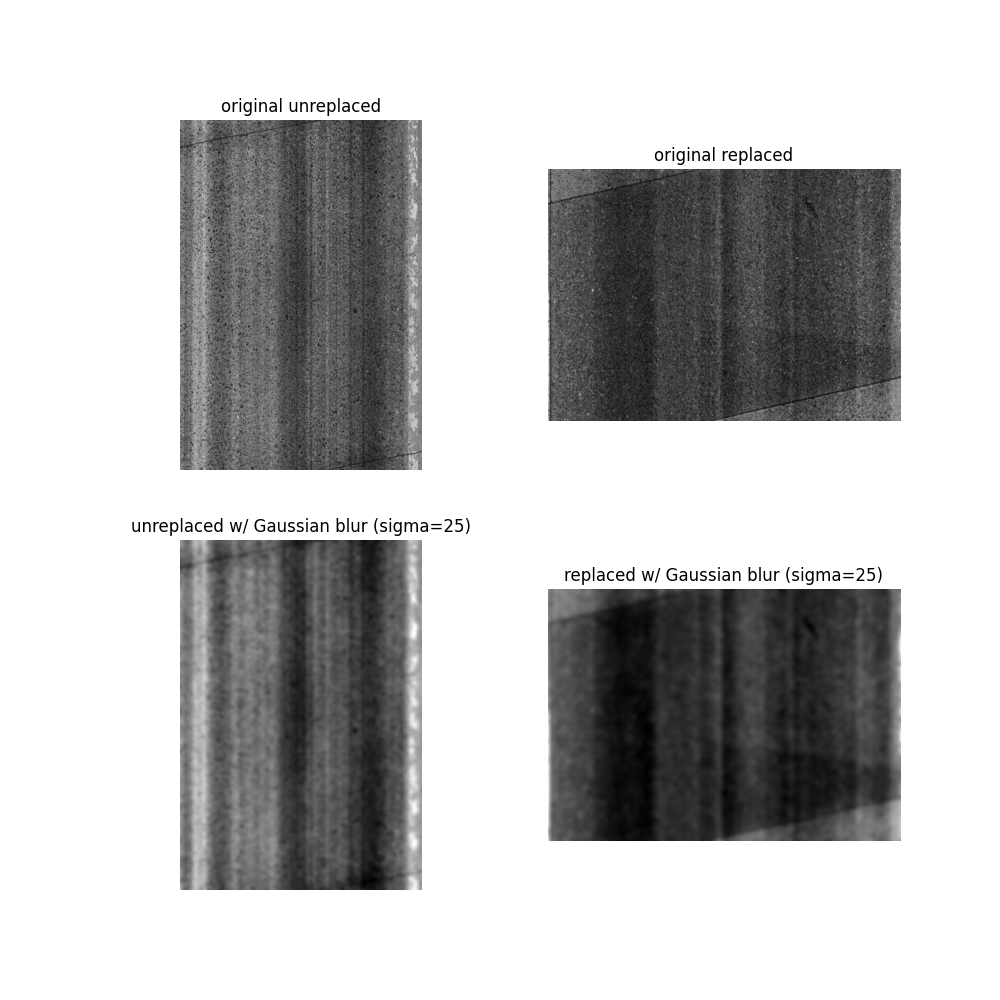

In [13]:
f, ax = plt.subplots(2, 2, figsize=figsize)

unreplaced_3 = rgb2gray(unreplaced_18_1)

unreplaced_3 *= 1.0
replaced_57 *= 1.0

mod_unreplaced_3 = gaussian(unreplaced_3, sigma=25)
mod_replaced_57 = gaussian(replaced_57, sigma=25)

ax[0,0].imshow(unreplaced_3, cmap="gray")
ax[0,0].set_title("original unreplaced")
ax[0,1].imshow(replaced_57, cmap="gray")
ax[0,1].set_title("original replaced")

ax[1,0].imshow(mod_unreplaced_3, cmap="gray")
ax[1,0].set_title("unreplaced w/ Gaussian blur (sigma=25)")
ax[1,1].imshow(mod_replaced_57, cmap="gray")
ax[1,1].set_title("replaced w/ Gaussian blur (sigma=25)")


for ax_i in ax.flatten():
    ax_i.set_frame_on(False)
    ax_i.set_axis_off()

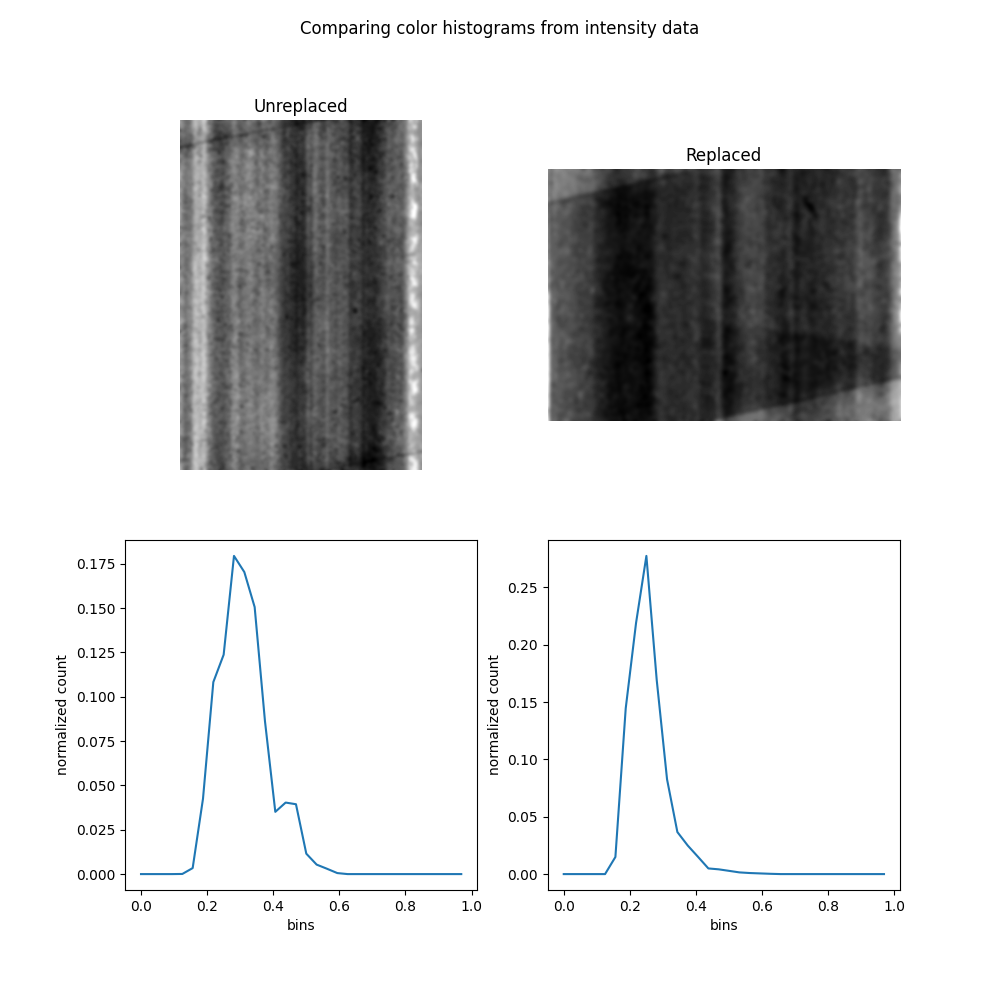

In [14]:
figsize = (10, 10)
f, ax = plt.subplots(2, 2, figsize=figsize)

f.suptitle("Comparing color histograms from intensity data")
ax[0,0].imshow(mod_unreplaced_3, cmap="gray")
ax[0,0].set_title("Unreplaced")

ax[0,1].imshow(mod_replaced_57, cmap="gray")
ax[0,1].set_title("Replaced")

hist1 = np.histogram(mod_unreplaced_3.ravel(), range=(0,1), bins=32)
hist2 = np.histogram(mod_replaced_57.ravel(), range=(0,1), bins=32)

histo1 = hist1[0].astype("float") / (np.sum(hist1[0]))
histo2 = hist2[0].astype("float") / (np.sum(hist2[0]))
                                       
ax[1,0].plot(hist1[1][:-1], histo1)
ax[1,0].set_xlabel("bins")
ax[1,0].set_ylabel("normalized count")
ax[1,1].plot(hist2[1][:-1], histo2)
ax[1,1].set_xlabel("bins")
ax[1,1].set_ylabel("normalized count")


for ax_i in ax[0,:]:
    ax_i.set_frame_on(False)
    ax_i.set_axis_off()

### Observations
- It appears that Local Binary Pattern (LBP) with radius of 1 pixel and 8 number of features is best at capturing the texture data of the unreplaced and certain replaced slabs
- However, LBP does not work too well with replaced slabs with similar texture as unreplaced slabs, so intensity data must also be acknowledged in classification
    - Gaussian filtering with sigma=50 can help reduce noise but still retain color information from intensity images

### Proposition
- We will use length and histogram data as features for the model.

# Data Preparation

In [30]:
# data = []

# for dataset in os.listdir(os.path.join("..", "data")):
#     with open(os.path.join("..", "data", dataset, "ground-truths.csv"), "r") as gt:
#         gt_r = csv.reader(gt)
#         gt_r.__next__()
        
#         for slab, is_replaced in tqdm(gt_r):
#             if is_replaced == "-1":
#                 continue
            
#             img = io.imread(os.path.join("..", "data", dataset, "Slabs", f"{slab}.png"))
#             img = rgb2gray(img)
                        
#             lbp_d = local_binary_pattern(img, 8, 1, "default")
#             (lbp_d_hist, _) = np.histogram(lbp_d.ravel())
#             lbp_d_hist = lbp_d_hist.astype("float") / np.sum(lbp_d_hist)
            
#             lbp_r = local_binary_pattern(img, 8, 1, "ror")
#             lbp_r_hist, _ = np.histogram(lbp_r.ravel())
#             lbp_r_hist = lbp_r_hist.astype("float") / np.sum(lbp_r_hist)
            
#             lbp_u = local_binary_pattern(img, 8, 1, "uniform")
#             lbp_u_hist, _ = np.histogram(lbp_u.ravel())
#             lbp_u_hist = lbp_u_hist.astype("float") / np.sum(lbp_u_hist)
            
#             lbp_n = local_binary_pattern(img, 8, 1, "nri_uniform")
#             lbp_n_hist, _ = np.histogram(lbp_n.ravel())
#             lbp_n_hist = lbp_n_hist.astype("float") / np.sum(lbp_n_hist)
            
#             lbp_v = local_binary_pattern(img, 8, 1, "var")
#             lbp_v_hist, _ = np.histogram(lbp_v.ravel(), range=(np.nanmin(lbp_v), np.nanmax(lbp_v)))
#             lbp_v_hist = lbp_v_hist.astype("float") / np.sum(lbp_v_hist)
            
#             blur_img = gaussian(img, sigma=25)
#             (intensity_hist, _) = np.histogram(blur_img.ravel(), bins=32, range=(0,1))
#             intensity_hist = intensity_hist.astype("float") / np.sum(intensity_hist)
            
#             data.append([np.shape(img)[0], *lbp_d_hist, *lbp_r_hist, *lbp_u_hist, *lbp_n_hist, *lbp_v_hist, *intensity_hist, int(is_replaced)])


189it [1:02:35, 19.87s/it]
609it [5:07:55, 30.34s/it] 
246it [1:25:45, 20.92s/it]


In [16]:
# ### New dataset with fixed Local Binary Pattern

# lbp_256 = []

# for dataset in os.listdir(os.path.join("..", "data")):
#     with open(os.path.join("..", "data", dataset, "ground-truths.csv"), "r") as gt:
#         gt_r = csv.reader(gt)
#         gt_r.__next__()
        
#         for slab, is_replaced in tqdm(gt_r):
#             if is_replaced == "-1":
#                 continue
            
#             img = io.imread(os.path.join("..", "data", dataset, "Slabs", f"{slab}.png"))
#             img = rgb2gray(img)
            
#             lbp_d = local_binary_pattern(img, 8, 1, "default")
#             (lbp_d_hist, _) = np.histogram(lbp_d.ravel(), bins=256)
#             lbp_d_hist = lbp_d_hist.astype("float") / np.sum(lbp_d_hist)
            
#             lbp_r = local_binary_pattern(img, 8, 1, "ror")
#             lbp_r_hist, _ = np.histogram(lbp_r.ravel(), bins=256)
#             lbp_r_hist = lbp_r_hist.astype("float") / np.sum(lbp_r_hist)
            
#             lbp_256.append([*lbp_d_hist, *lbp_r_hist, int(is_replaced)])
                        


# ###

189it [21:47,  6.92s/it]
609it [1:17:07,  7.60s/it]
246it [23:06,  5.63s/it]


In [17]:
# lbp_df = pd.DataFrame(lbp_256)
# lbp_df.to_csv("lbp_def_ror.csv")

In [31]:
# print(data[0])

[6451, 0.10479664282392541, 0.12814314502734903, 0.09963376663640189, 0.0042244170339039355, 0.15541878335584738, 0.08695825674867684, 0.007112739996013907, 0.14816024093717475, 0.0854582899661182, 0.18009371747458866, 0.6072005226210776, 0.28857922359767035, 0.05254427884934783, 0.0011951635405363509, 0.024232167770223887, 0.0, 0.0, 0.0, 0.0, 0.02624864362114401, 0.001974754744557876, 0.014575591824080431, 0.01169993577961335, 0.12932829904555218, 0.4394935447438935, 0.28424293022122815, 0.051281440308257854, 0.022813207254689195, 0.02624864362114401, 0.018341652456983413, 0.012284385588059436, 0.008315964302323007, 0.03537994109440397, 0.09621423035188342, 0.22585317890913922, 0.28747640454414597, 0.2157909515689705, 0.03942524968443431, 0.023369887282148945, 0.05588980667449122, 0.999178623532345, 0.00012094049709822547, 0.0001812335434537877, 0.00026217064535798476, 0.00015252678809860452, 4.0313499032741825e-05, 2.108706103251111e-05, 2.3346389000280155e-05, 1.5992497967933844e-05

In [ ]:
# print(data[0][])

In [62]:
# dataframe = pd.DataFrame(data)
# dataframe.describe()

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,83
count,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,...,1027.000000,1027.000000,1027.000000,1.027000e+03,1.027000e+03,1027.0,1027.0,1027.0,1027.0,1027.000000
mean,5163.430380,0.100245,0.126992,0.098267,0.004278,0.160505,0.083922,0.007392,0.150971,0.082264,...,0.000104,0.000022,0.000004,4.642132e-07,1.841095e-07,0.0,0.0,0.0,0.0,0.199611
std,1603.432568,0.006004,0.005570,0.007719,0.000302,0.006805,0.007404,0.000459,0.005755,0.004417,...,0.000542,0.000206,0.000041,1.004139e-05,5.900127e-06,0.0,0.0,0.0,0.0,0.399902
min,1328.000000,0.071850,0.108294,0.039836,0.003607,0.105330,0.036534,0.004202,0.083303,0.061501,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
25%,4064.500000,0.099937,0.124857,0.096452,0.004153,0.156919,0.082334,0.007096,0.148132,0.081764,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
50%,5160.000000,0.101884,0.127938,0.099006,0.004256,0.158659,0.084789,0.007331,0.149983,0.083367,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
75%,6718.000000,0.103598,0.130439,0.101582,0.004368,0.160722,0.087046,0.007658,0.151884,0.084659,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
max,12484.000000,0.136097,0.196982,0.112632,0.007236,0.186705,0.097398,0.009036,0.173620,0.100553,...,0.010201,0.005922,0.000721,3.090795e-04,1.890804e-04,0.0,0.0,0.0,0.0,1.000000


In [63]:
# dataframe = dataframe.sample(frac=1)
# dataframe.head()

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,83
68,6735,0.102314,0.131605,0.095724,0.003998,0.158454,0.082295,0.007077,0.148395,0.083888,...,0.000004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
821,2412,0.091369,0.126094,0.087123,0.004056,0.171533,0.071825,0.007470,0.156846,0.077159,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
61,4840,0.099328,0.127780,0.099258,0.004042,0.160460,0.084375,0.007754,0.150877,0.081551,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
208,6480,0.104132,0.129686,0.098483,0.004314,0.156718,0.085039,0.007285,0.148384,0.084298,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
977,3825,0.100550,0.117911,0.112632,0.004462,0.160160,0.095083,0.007026,0.153246,0.083482,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [65]:
# all_x = dataframe.iloc[:,:-1]
# all_x.head()

,0,1,2,3,4,5,6,7,8,9,...,73,74,75,76,77,78,79,80,81,82
68,6735,0.102314,0.131605,0.095724,0.003998,0.158454,0.082295,0.007077,0.148395,0.083888,...,0.000287,0.000004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
821,2412,0.091369,0.126094,0.087123,0.004056,0.171533,0.071825,0.007470,0.156846,0.077159,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61,4840,0.099328,0.127780,0.099258,0.004042,0.160460,0.084375,0.007754,0.150877,0.081551,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
208,6480,0.104132,0.129686,0.098483,0.004314,0.156718,0.085039,0.007285,0.148384,0.084298,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
977,3825,0.100550,0.117911,0.112632,0.004462,0.160160,0.095083,0.007026,0.153246,0.083482,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
# all_y = dataframe.iloc[:,-1:]
# all_y.describe()

,83
count,1027.000000
mean,0.199611
std,0.399902
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


## Statistics
- 83 features
    - Slab length (1)
    - Local Binary Pattern histogram (default) (10)
    - Local Binary Pattern (ror) (10)
    - Local Binary Pattern (uniform) (10)
    - Local Binary Pattern (nri_uniform) (10)
    - Local Binary Pattern (var) (10)
    - Gaussian blur color histogram (32)
    

In [67]:
# try:
#     dataframe
#     dataframe = dataframe.rename(columns={"83", "y"})
# except:
#     dataframe = pd.read_csv("all_inputs_gts.csv")
#     dataframe = dataframe.rename(columns={"83": "y"})

In [68]:
# dataframe.describe()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,74,75,76,77,78,79,80,81,82,y
count,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,...,1027.000000,1027.000000,1027.000000,1.027000e+03,1.027000e+03,1027.0,1027.0,1027.0,1027.0,1027.000000
mean,513.000000,5163.430380,0.100245,0.126992,0.098267,0.004278,0.160505,0.083922,0.007392,0.150971,...,0.000104,0.000022,0.000004,4.642132e-07,1.841095e-07,0.0,0.0,0.0,0.0,0.199611
std,296.613666,1603.432568,0.006004,0.005570,0.007719,0.000302,0.006805,0.007404,0.000459,0.005755,...,0.000542,0.000206,0.000041,1.004139e-05,5.900127e-06,0.0,0.0,0.0,0.0,0.399902
min,0.000000,1328.000000,0.071850,0.108294,0.039836,0.003607,0.105330,0.036534,0.004202,0.083303,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
25%,256.500000,4064.500000,0.099937,0.124857,0.096452,0.004153,0.156919,0.082334,0.007096,0.148132,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
50%,513.000000,5160.000000,0.101884,0.127938,0.099006,0.004256,0.158659,0.084789,0.007331,0.149983,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
75%,769.500000,6718.000000,0.103598,0.130439,0.101582,0.004368,0.160722,0.087046,0.007658,0.151884,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
max,1026.000000,12484.000000,0.136097,0.196982,0.112632,0.007236,0.186705,0.097398,0.009036,0.173620,...,0.010201,0.005922,0.000721,3.090795e-04,1.890804e-04,0.0,0.0,0.0,0.0,1.000000


In [70]:
# try:
#     dataframe = dataframe.rename(columns={"0": "Length"})
# except:
#     pass

# dataframe.describe()

,Unnamed: 0,Length,1,2,3,4,5,6,7,8,...,74,75,76,77,78,79,80,81,82,y
count,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,...,1027.000000,1027.000000,1027.000000,1.027000e+03,1.027000e+03,1027.0,1027.0,1027.0,1027.0,1027.000000
mean,513.000000,5163.430380,0.100245,0.126992,0.098267,0.004278,0.160505,0.083922,0.007392,0.150971,...,0.000104,0.000022,0.000004,4.642132e-07,1.841095e-07,0.0,0.0,0.0,0.0,0.199611
std,296.613666,1603.432568,0.006004,0.005570,0.007719,0.000302,0.006805,0.007404,0.000459,0.005755,...,0.000542,0.000206,0.000041,1.004139e-05,5.900127e-06,0.0,0.0,0.0,0.0,0.399902
min,0.000000,1328.000000,0.071850,0.108294,0.039836,0.003607,0.105330,0.036534,0.004202,0.083303,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
25%,256.500000,4064.500000,0.099937,0.124857,0.096452,0.004153,0.156919,0.082334,0.007096,0.148132,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
50%,513.000000,5160.000000,0.101884,0.127938,0.099006,0.004256,0.158659,0.084789,0.007331,0.149983,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
75%,769.500000,6718.000000,0.103598,0.130439,0.101582,0.004368,0.160722,0.087046,0.007658,0.151884,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
max,1026.000000,12484.000000,0.136097,0.196982,0.112632,0.007236,0.186705,0.097398,0.009036,0.173620,...,0.010201,0.005922,0.000721,3.090795e-04,1.890804e-04,0.0,0.0,0.0,0.0,1.000000


In [109]:
# try:
#     dataframe = dataframe.rename(columns={str(i): f'LBP:default ({i})' for i in range(1, 11)})
#     dataframe = dataframe.rename(columns={str(i): f'LBP:ror ({i})' for i in range(11, 21)})
#     dataframe = dataframe.rename(columns={str(i): f'LBP:uniform ({i})' for i in range(21, 31)})
#     dataframe = dataframe.rename(columns={str(i): f'LBP:nri_uniform ({i})' for i in range(31, 41)})
#     dataframe = dataframe.rename(columns={str(i): f'LBP:var ({i})' for i in range(41, 51)})
#     dataframe = dataframe.rename(columns={str(i): f'color_hist ({i})' for i in range(51, 83)})
# except:
#     pass

# dataframe.describe()

,Unnamed: 0,Length,LBP:default (1),LBP:default (2),LBP:default (3),LBP:default (4),LBP:default (5),LBP:default (6),LBP:default (7),LBP:default (8),...,color_hist (74),color_hist (75),color_hist (76),color_hist (77),color_hist (78),color_hist (79),color_hist (80),color_hist (81),color_hist (82),y
count,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,...,1027.000000,1027.000000,1027.000000,1.027000e+03,1.027000e+03,1027.0,1027.0,1027.0,1027.0,1027.000000
mean,513.000000,5163.430380,0.100245,0.126992,0.098267,0.004278,0.160505,0.083922,0.007392,0.150971,...,0.000104,0.000022,0.000004,4.642132e-07,1.841095e-07,0.0,0.0,0.0,0.0,0.199611
std,296.613666,1603.432568,0.006004,0.005570,0.007719,0.000302,0.006805,0.007404,0.000459,0.005755,...,0.000542,0.000206,0.000041,1.004139e-05,5.900127e-06,0.0,0.0,0.0,0.0,0.399902
min,0.000000,1328.000000,0.071850,0.108294,0.039836,0.003607,0.105330,0.036534,0.004202,0.083303,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
25%,256.500000,4064.500000,0.099937,0.124857,0.096452,0.004153,0.156919,0.082334,0.007096,0.148132,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
50%,513.000000,5160.000000,0.101884,0.127938,0.099006,0.004256,0.158659,0.084789,0.007331,0.149983,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
75%,769.500000,6718.000000,0.103598,0.130439,0.101582,0.004368,0.160722,0.087046,0.007658,0.151884,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000
max,1026.000000,12484.000000,0.136097,0.196982,0.112632,0.007236,0.186705,0.097398,0.009036,0.173620,...,0.010201,0.005922,0.000721,3.090795e-04,1.890804e-04,0.0,0.0,0.0,0.0,1.000000


In [111]:
# print(dataframe.columns)

Index(['Unnamed: 0', 'Length', 'LBP:default (1)', 'LBP:default (2)',
       'LBP:default (3)', 'LBP:default (4)', 'LBP:default (5)',
       'LBP:default (6)', 'LBP:default (7)', 'LBP:default (8)',
       'LBP:default (9)', 'color_hist (10)', 'color_hist (11)',
       'color_hist (12)', 'color_hist (13)', 'color_hist (14)',
       'color_hist (15)', 'color_hist (16)', 'color_hist (17)',
       'color_hist (18)', 'color_hist (19)', 'color_hist (20)',
       'color_hist (21)', 'color_hist (22)', 'color_hist (23)',
       'color_hist (24)', 'color_hist (25)', 'color_hist (26)',
       'color_hist (27)', 'color_hist (28)', 'color_hist (29)',
       'color_hist (30)', 'color_hist (31)', 'LBP:nri_uniform (32)',
       'LBP:nri_uniform (33)', 'LBP:nri_uniform (34)', 'LBP:nri_uniform (35)',
       'LBP:nri_uniform (36)', 'LBP:nri_uniform (37)', 'LBP:nri_uniform (38)',
       'LBP:nri_uniform (39)', 'LBP:nri_uniform (40)', 'LBP:var (41)',
       'LBP:var (42)', 'LBP:var (43)', 'LBP:var (44)', 'L

In [112]:
# dataframe.to_csv("labeled_data.csv")

In [38]:
# dataframe = pd.read_csv("labeled_data.csv")
# dataframe = dataframe.iloc[:,1:]

In [39]:
# all_unreplaced = dataframe.query('y == 0')
# all_replaced = dataframe.query('y == 1')

In [40]:
# all_unreplaced.describe()

,Unnamed: 0,Length,LBP:default (1),LBP:default (2),LBP:default (3),LBP:default (4),LBP:default (5),LBP:default (6),LBP:default (7),LBP:default (8),...,color_hist (74),color_hist (75),color_hist (76),color_hist (77),color_hist (78),color_hist (79),color_hist (80),color_hist (81),color_hist (82),y
count,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,...,822.000000,822.000000,822.000000,8.220000e+02,8.220000e+02,822.0,822.0,822.0,822.0,822.0
mean,461.985401,5691.763990,0.102170,0.127522,0.100304,0.004269,0.158426,0.086035,0.007328,0.149844,...,0.000104,0.000024,0.000004,5.575640e-07,2.300249e-07,0.0,0.0,0.0,0.0,0.0
std,276.186498,1226.204166,0.002031,0.003558,0.004002,0.000144,0.002123,0.003601,0.000338,0.002086,...,0.000471,0.000226,0.000045,1.120687e-05,6.594938e-06,0.0,0.0,0.0,0.0,0.0
min,0.000000,1854.000000,0.093347,0.116665,0.088634,0.003747,0.151963,0.074990,0.006442,0.141481,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.0
25%,232.250000,4920.500000,0.100822,0.125986,0.097558,0.004168,0.156969,0.083643,0.007096,0.148351,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.0
50%,452.500000,5344.000000,0.102186,0.128051,0.099699,0.004260,0.158400,0.085435,0.007292,0.149832,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.0
75%,689.750000,6789.000000,0.103657,0.130271,0.102112,0.004366,0.159861,0.087590,0.007607,0.151337,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.0
max,1022.000000,12484.000000,0.107196,0.138016,0.112632,0.004694,0.167783,0.097398,0.008404,0.156680,...,0.007029,0.005922,0.000721,3.090795e-04,1.890804e-04,0.0,0.0,0.0,0.0,0.0


In [41]:
# all_replaced.describe()

,Unnamed: 0,Length,LBP:default (1),LBP:default (2),LBP:default (3),LBP:default (4),LBP:default (5),LBP:default (6),LBP:default (7),LBP:default (8),...,color_hist (74),color_hist (75),color_hist (76),color_hist (77),color_hist (78),color_hist (79),color_hist (80),color_hist (81),color_hist (82),y
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,...,205.000000,205.000000,205.000000,2.050000e+02,205.0,205.0,205.0,205.0,205.0,205.0
mean,717.556098,3044.941463,0.092528,0.124868,0.090100,0.004312,0.168844,0.075451,0.007648,0.155492,...,0.000102,0.000015,0.000003,8.989930e-08,0.0,0.0,0.0,0.0,0.0,1.0
std,288.037584,1115.655754,0.009484,0.009971,0.012307,0.000612,0.011290,0.011550,0.000719,0.011109,...,0.000764,0.000083,0.000019,1.217894e-06,0.0,0.0,0.0,0.0,0.0,0.0
min,15.000000,1328.000000,0.071850,0.108294,0.039836,0.003607,0.105330,0.036534,0.004202,0.083303,...,0.000000,0.000000,0.000000,0.000000e+00,0.0,0.0,0.0,0.0,0.0,1.0
25%,641.000000,2292.000000,0.085333,0.117036,0.087529,0.003941,0.156467,0.072847,0.007120,0.146262,...,0.000000,0.000000,0.000000,0.000000e+00,0.0,0.0,0.0,0.0,0.0,1.0
50%,825.000000,2957.000000,0.089883,0.124254,0.094008,0.004218,0.172895,0.079465,0.007660,0.155838,...,0.000000,0.000000,0.000000,0.000000e+00,0.0,0.0,0.0,0.0,0.0,1.0
75%,939.000000,3594.000000,0.102578,0.132475,0.097646,0.004383,0.177202,0.082327,0.008223,0.165227,...,0.000000,0.000000,0.000000,0.000000e+00,0.0,0.0,0.0,0.0,0.0,1.0
max,1026.000000,10657.000000,0.136097,0.196982,0.111290,0.007236,0.186705,0.097006,0.009036,0.173620,...,0.010201,0.000622,0.000189,1.741292e-05,0.0,0.0,0.0,0.0,0.0,1.0


{'whiskers': [<matplotlib.lines.Line2D at 0x1d6ae9ac160>,
 'caps': [<matplotlib.lines.Line2D at 0x1d6ae9ac700>,
 'boxes': [<matplotlib.lines.Line2D at 0x1d6ae9a2e50>],
 'medians': [<matplotlib.lines.Line2D at 0x1d6ae9acca0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1d6ae9acf70>],
 'means': []}

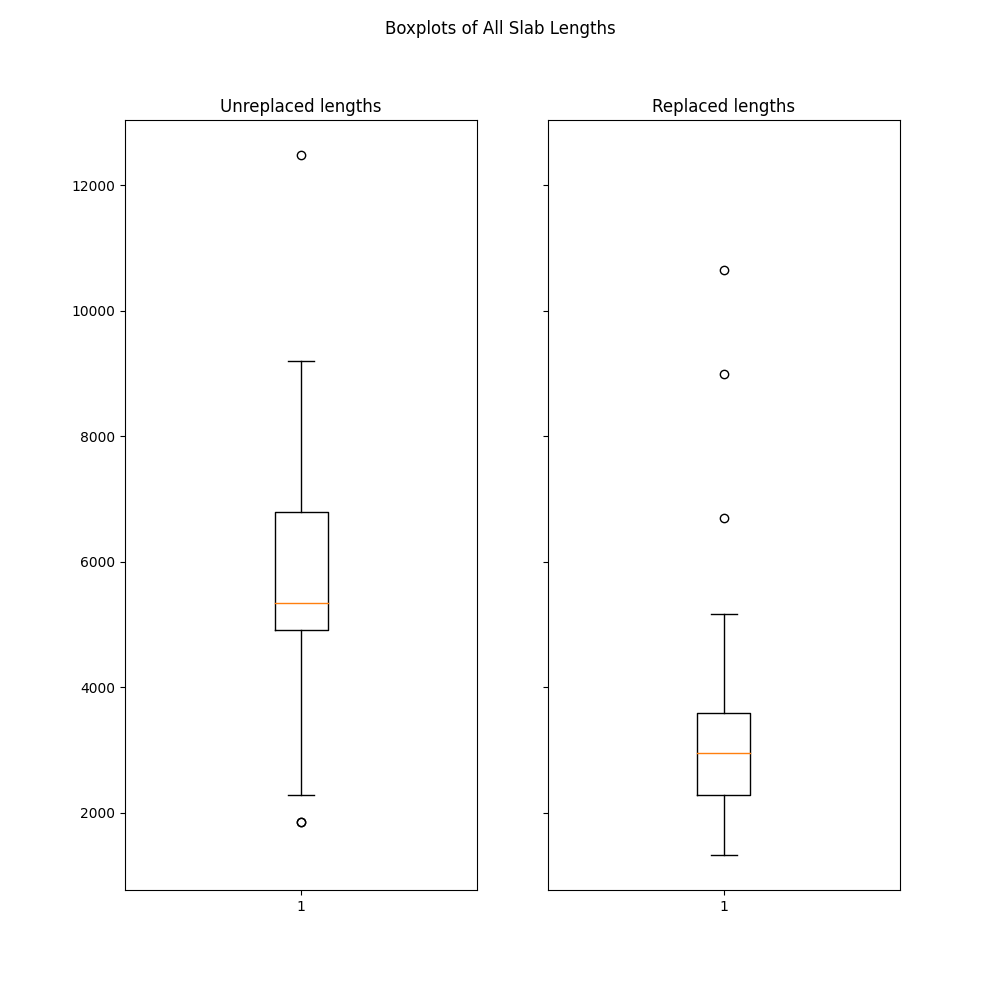

In [42]:
# # Comparing lengths

# figsize = (10, 10)
# f, ax = plt.subplots(1, 2, sharey=True, figsize=figsize)
# f.suptitle("Boxplots of All Slab Lengths")

# ax[0].set_title("Unreplaced lengths")
# ax[0].boxplot(all_unreplaced["Length"])

# ax[1].set_title("Replaced lengths")
# ax[1].boxplot(all_replaced["Length"])

In [43]:
# avg_unreplaced = all_unreplaced.mean(axis=0)
# avg_replaced = all_replaced.mean(axis=0)

In [44]:
# avg_unreplaced[42:52]

LBP:var (41)    0.999201
LBP:var (42)    0.000203
LBP:var (43)    0.000190
LBP:var (44)    0.000155
LBP:var (45)    0.000092
LBP:var (46)    0.000048
LBP:var (47)    0.000035
LBP:var (48)    0.000037
LBP:var (49)    0.000032
LBP:var (50)    0.000007
dtype: float64

[None, None, None, None, None]

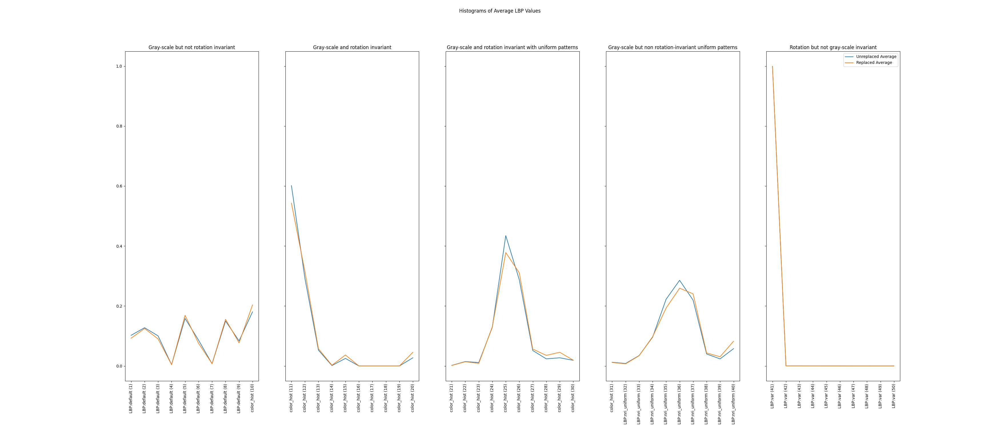

In [45]:
# # Comparing LBP 


# # (Default)
# figsize = (35, 15)
# f, ax = plt.subplots(1, 5, sharey=True, figsize=figsize)
# f.suptitle("Histograms of Average LBP Values")

# # ax[0].set_title("default")
# ax[0].set_title("Gray-scale but not rotation invariant")
# ax[0].plot(avg_unreplaced[2:12], label="Unreplaced Average")
# ax[0].plot(avg_replaced[2:12], label="Replaced Average")

# # ax[1].set_title("ror")
# ax[1].set_title("Gray-scale and rotation invariant")
# ax[1].plot(avg_unreplaced[12:22], label="Unreplaced Average")
# ax[1].plot(avg_replaced[12:22], label="Replaced Average")

# # ax[2].set_title("uniform")
# ax[2].set_title("Gray-scale and rotation invariant with uniform patterns")
# ax[2].plot(avg_unreplaced[22:32], label="Unreplaced Average")
# ax[2].plot(avg_replaced[22:32], label="Replaced Average")

# # ax[3].set_title("nri_uniform")
# ax[3].set_title("Gray-scale but non rotation-invariant uniform patterns")
# ax[3].plot(avg_unreplaced[32:42], label="Unreplaced Average")
# ax[3].plot(avg_replaced[32:42], label="Replaced Average")

# # ax[4].set_title("var")
# ax[4].set_title("Rotation but not gray-scale invariant")
# ax[4].plot(avg_unreplaced[42:52], label="Unreplaced Average")
# ax[4].plot(avg_replaced[42:52], label="Replaced Average")

# ax[4].legend()

# [ax[i].tick_params(axis='x', rotation=90) for i in range(len(ax))]

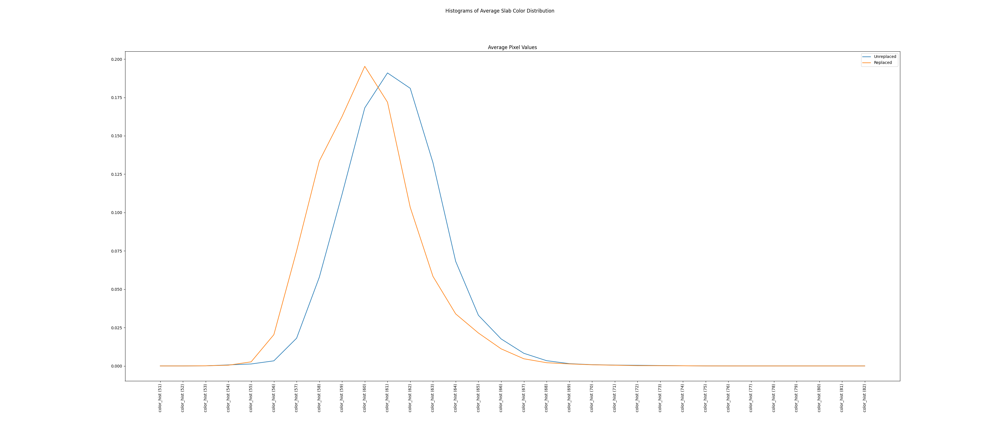

In [47]:
# f, ax = plt.subplots(1, 1, sharey=True, figsize=figsize)
# f.suptitle("Histograms of Average Slab Color Distribution")

# ax.set_title("Average Pixel Values")
# ax.plot(avg_unreplaced[52:-1], label="Unreplaced")
# ax.plot(avg_replaced[52:-1], label="Replaced")

# ax.legend()

# ax.tick_params(axis='x', rotation=90)

# # ax[1].set_title("Average Replaced Pixel Values")
# # ax[1].plot(avg_replaced[52:-1])

In [ ]:
# from sklearn.feature_selection import SelectKBest, chi2

In [ ]:
# k_all = pd.DataFrame(SelectKBest(chi2, k=16).fit_transform(all_x, all_y))
# k_all = pd.concat([k_all, all_y], axis=1)
# print(k_all)

In [ ]:
# k_xy = pd.DataFrame(k_all).to_csv('k_xy.csv')

In [41]:
# data_addendum = []
# data_gaussed = []

# for dataset in os.listdir(os.path.join("..", "data")):
#     with open(os.path.join("..", "data", dataset, "ground-truths.csv"), "r") as gt:
#         gt_r = csv.reader(gt)
#         gt_r.__next__()
        
#         for slab, is_replaced in tqdm(gt_r):
#             if is_replaced == "-1":
#                 continue
            
#             img = io.imread(os.path.join("..", "data", dataset, "Slabs", f"{slab}.png"))
#             img = np.around(rgb2gray(img) * 256).ravel()
            
#             # print(len(img))
                        
# #             lbp_d = local_binary_pattern(img, 8, 1, "default")
# #             (lbp_d_hist, _) = np.histogram(lbp_d.ravel())
# #             lbp_d_hist = lbp_d_hist.astype("float") / np.sum(lbp_d_hist)
            
# #             lbp_r = local_binary_pattern(img, 8, 1, "ror")
# #             lbp_r_hist, _ = np.histogram(lbp_r.ravel())
# #             lbp_r_hist = lbp_r_hist.astype("float") / np.sum(lbp_r_hist)
            
# #             lbp_u = local_binary_pattern(img, 8, 1, "uniform")
# #             lbp_u_hist, _ = np.histogram(lbp_u.ravel())
# #             lbp_u_hist = lbp_u_hist.astype("float") / np.sum(lbp_u_hist)
            
# #             lbp_n = local_binary_pattern(img, 8, 1, "nri_uniform")
# #             lbp_n_hist, _ = np.histogram(lbp_n.ravel())
# #             lbp_n_hist = lbp_n_hist.astype("float") / np.sum(lbp_n_hist)
            
# #             lbp_v = local_binary_pattern(img, 8, 1, "var")
# #             lbp_v_hist, _ = np.histogram(lbp_v.ravel(), range=(np.nanmin(lbp_v), np.nanmax(lbp_v)))
# #             lbp_v_hist = lbp_v_hist.astype("float") / np.sum(lbp_v_hist)
            
#             # blur_img = gaussian(img, sigma=25)
#             # (intensity_hist, _) = np.histogram(blur_img.ravel(), bins=32, range=(0,1))
#             # intensity_hist = intensity_hist.astype("float") / np.sum(intensity_hist)
            
#             # intensity_hist, _ = np.histogram(img, bins=256)
#             # intensity_hist = intensity_hist.astype("float") / np.sum(intensity_hist)
            
#             gauss_hist, _ = np.histogram(gaussian(img, sigma=25), bins=256)
#             gauss_hist = gauss_hist.astype("float") / np.sum(gauss_hist)
            
            
            
#             # print(intensity_hist)
            
#             # data_addendum.append([*intensity_hist, int(is_replaced)]) 
#             data_gaussed.append([*gauss_hist, int(is_replaced)])
            

189it [08:56,  2.84s/it]
609it [31:27,  3.10s/it]
246it [09:24,  2.29s/it]


In [ ]:
# hist_df = pd.DataFrame(data_addendum)
# hist_df.to_csv("256_raw.csv")

In [42]:
# gauss_df = pd.DataFrame(data_gaussed)
# gauss_df.to_csv("256_gaussed.csv")

In [ ]:
# hist_df_gt = hist_df.rename(columns={256: 'y'})
# hist_df_gt.describe()

In [43]:
# gauss_df_gt = gauss_df.rename(columns={256: 'y'})
# gauss_df_gt.describe()

,0,1,2,3,4,5,6,7,8,9,...,247,248,249,250,251,252,253,254,255,y
count,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1027.000000,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,...,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1027.000000
mean,3.295999e-06,5.414314e-06,8.451093e-06,1.295590e-05,0.000019,2.667854e-05,3.494812e-05,4.346592e-05,5.227031e-05,6.113079e-05,...,1.906486e-05,1.508580e-05,1.177570e-05,9.168700e-06,6.801099e-06,4.876905e-06,3.376012e-06,2.287571e-06,1.521417e-06,0.199611
std,3.597290e-06,8.437457e-06,1.933354e-05,4.175940e-05,0.000073,1.075533e-04,1.302003e-04,1.464281e-04,1.596504e-04,1.663863e-04,...,5.085208e-05,3.990071e-05,3.026092e-05,2.319343e-05,1.645762e-05,1.082806e-05,6.383804e-06,3.737183e-06,1.964022e-06,0.399902
min,4.284857e-08,4.284857e-08,5.894702e-08,1.167179e-07,0.000000,5.998978e-08,6.532221e-08,5.998978e-08,5.998978e-08,5.998978e-08,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.167448e-08,0.000000
25%,1.300226e-06,1.648021e-06,2.301655e-06,2.998920e-06,0.000004,4.716991e-06,5.887761e-06,6.997230e-06,8.143126e-06,9.832908e-06,...,7.114495e-07,5.336542e-07,4.574104e-07,3.900706e-07,3.299011e-07,2.190833e-07,1.646523e-07,1.783226e-07,1.979569e-07,0.000000
50%,2.148928e-06,2.986312e-06,4.238952e-06,5.582275e-06,0.000007,9.363235e-06,1.134082e-05,1.377296e-05,1.632606e-05,1.895003e-05,...,4.338928e-06,3.494490e-06,2.904445e-06,2.416899e-06,2.012336e-06,1.773988e-06,1.417351e-06,1.124859e-06,9.871603e-07,0.000000
75%,3.699892e-06,5.665790e-06,8.029444e-06,1.131816e-05,0.000014,1.856682e-05,2.251331e-05,2.708420e-05,3.131955e-05,3.829684e-05,...,1.518905e-05,1.185052e-05,9.627848e-06,7.527537e-06,6.059534e-06,4.598480e-06,3.591821e-06,2.665726e-06,1.909128e-06,0.000000
max,3.186422e-05,9.254189e-05,4.014205e-04,8.611982e-04,0.001521,2.063911e-03,2.105674e-03,1.978768e-03,2.055849e-03,1.740833e-03,...,5.628564e-04,4.547231e-04,3.852426e-04,2.952251e-04,2.115142e-04,1.208047e-04,5.520887e-05,3.328282e-05,1.672913e-05,1.000000


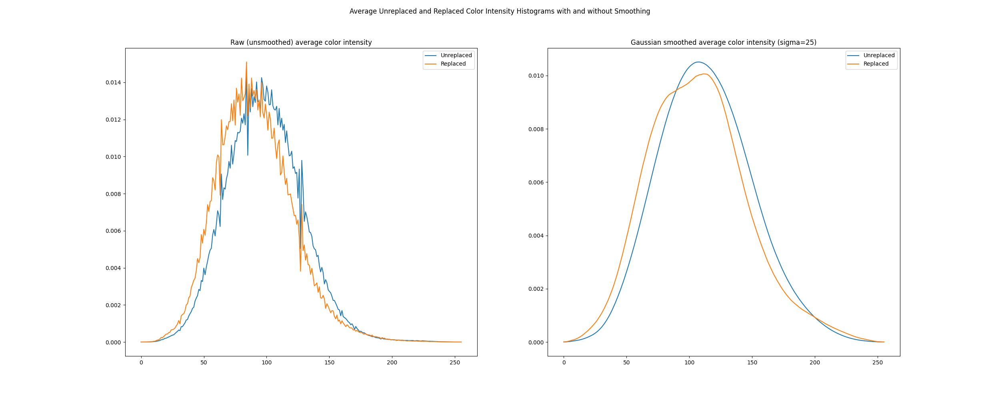

In [44]:
# f, ax = plt.subplots(1, 2, figsize=(25, 10))
# f.suptitle("Average Unreplaced and Replaced Color Intensity Histograms with and without Smoothing")

# raw_un = hist_df_gt.query('y == 0')
# raw_re = hist_df_gt.query('y == 1')

# gauss_un = gauss_df_gt.query('y == 0')
# gauss_re = gauss_df_gt.query('y == 1')

# ax[0].set_title("Raw (unsmoothed) average color intensity")
# ax[0].plot(raw_un.mean(axis=0).iloc[:-1], label="Unreplaced")
# ax[0].plot(raw_re.mean(axis=0).iloc[:-1], label="Replaced")

# ax[1].set_title("Gaussian smoothed average color intensity (sigma=25)")
# ax[1].plot(gauss_un.mean(axis=0).iloc[:-1], label="Unreplaced")
# ax[1].plot(gauss_re.mean(axis=0).iloc[:-1], label="Replaced")

# ax[0].legend()
# ax[1].legend()

In [4]:
# # dataframe_2 = pd.DataFrame(data_addendum)
# dataframe_2 = pd.read_csv("hist_data_all_bins.csv")

# old_df = pd.read_csv("all_inputs_gts.csv")
# old_df = old_df.rename(columns={"83": "y"})

# all_y = old_df.iloc[:,-1]
# hist_df = pd.concat([dataframe_2, all_y], axis=1)
# hist_df.describe()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,248,249,250,251,252,253,254,255,y.1,y
count,1027.000000,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,...,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1027.000000,1027.000000
mean,513.000000,1.928463e-07,4.614922e-07,8.890785e-07,1.133235e-06,1.996476e-06,3.343540e-06,4.966149e-06,7.415373e-06,1.252788e-05,...,1.749001e-06,1.320235e-06,9.391441e-07,6.862786e-07,5.124222e-07,3.929434e-07,2.336581e-07,1.549930e-07,0.199611,0.199611
std,296.613666,2.191825e-07,7.292661e-07,1.489420e-06,2.119190e-06,4.015036e-06,7.929882e-06,1.267707e-05,1.796791e-05,3.266560e-05,...,3.391555e-06,2.631411e-06,1.803936e-06,1.288257e-06,9.228206e-07,5.825422e-07,2.952706e-07,1.473482e-07,0.399902,0.399902
min,0.000000,2.645053e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.645053e-08,0.000000,0.000000
25%,256.500000,7.034242e-08,1.165981e-07,1.968549e-07,1.221206e-07,4.539679e-08,2.081125e-07,4.164769e-07,1.994464e-07,8.153775e-07,...,4.801842e-08,5.684636e-08,0.000000e+00,0.000000e+00,0.000000e+00,7.647886e-08,5.765429e-08,6.484265e-08,0.000000,0.000000
50%,513.000000,1.253801e-07,2.553391e-07,4.478705e-07,5.298346e-07,8.429061e-07,1.211265e-06,1.798280e-06,2.569621e-06,3.985262e-06,...,5.802746e-07,4.475006e-07,3.649274e-07,2.587097e-07,2.316862e-07,2.175751e-07,1.413935e-07,1.040463e-07,0.000000,0.000000
75%,769.500000,2.247927e-07,5.303897e-07,9.610821e-07,1.263341e-06,2.155471e-06,3.231693e-06,4.726977e-06,6.628843e-06,1.009317e-05,...,1.866098e-06,1.462186e-06,1.076292e-06,8.485802e-07,6.222535e-07,4.985724e-07,2.964520e-07,1.868371e-07,0.000000,0.000000
max,1026.000000,2.494507e-06,9.210489e-06,1.554270e-05,2.820712e-05,5.178395e-05,1.043396e-04,2.208228e-04,2.930520e-04,4.425478e-04,...,5.179077e-05,3.396714e-05,2.433023e-05,1.293781e-05,1.328748e-05,7.517918e-06,3.014501e-06,1.535429e-06,1.000000,1.000000


In [7]:
# dataframe_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
count,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1027.000000,...,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03
mean,1.928463e-07,4.614922e-07,8.890785e-07,1.133235e-06,1.996476e-06,3.343540e-06,4.966149e-06,7.415373e-06,1.252788e-05,0.000019,...,3.308403e-06,2.368658e-06,1.749001e-06,1.320235e-06,9.391441e-07,6.862786e-07,5.124222e-07,3.929434e-07,2.336581e-07,1.549930e-07
std,2.191825e-07,7.292661e-07,1.489420e-06,2.119190e-06,4.015036e-06,7.929882e-06,1.267707e-05,1.796791e-05,3.266560e-05,0.000051,...,6.419487e-06,5.140573e-06,3.391555e-06,2.631411e-06,1.803936e-06,1.288257e-06,9.228206e-07,5.825422e-07,2.952706e-07,1.473482e-07
min,2.645053e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.645053e-08
25%,7.034242e-08,1.165981e-07,1.968549e-07,1.221206e-07,4.539679e-08,2.081125e-07,4.164769e-07,1.994464e-07,8.153775e-07,0.000001,...,1.097196e-07,0.000000e+00,4.801842e-08,5.684636e-08,0.000000e+00,0.000000e+00,0.000000e+00,7.647886e-08,5.765429e-08,6.484265e-08
50%,1.253801e-07,2.553391e-07,4.478705e-07,5.298346e-07,8.429061e-07,1.211265e-06,1.798280e-06,2.569621e-06,3.985262e-06,0.000006,...,1.055045e-06,7.318304e-07,5.802746e-07,4.475006e-07,3.649274e-07,2.587097e-07,2.316862e-07,2.175751e-07,1.413935e-07,1.040463e-07
75%,2.247927e-07,5.303897e-07,9.610821e-07,1.263341e-06,2.155471e-06,3.231693e-06,4.726977e-06,6.628843e-06,1.009317e-05,0.000015,...,3.383286e-06,2.420002e-06,1.866098e-06,1.462186e-06,1.076292e-06,8.485802e-07,6.222535e-07,4.985724e-07,2.964520e-07,1.868371e-07
max,2.494507e-06,9.210489e-06,1.554270e-05,2.820712e-05,5.178395e-05,1.043396e-04,2.208228e-04,2.930520e-04,4.425478e-04,0.000786,...,7.208772e-05,8.066983e-05,5.179077e-05,3.396714e-05,2.433023e-05,1.293781e-05,1.328748e-05,7.517918e-06,3.014501e-06,1.535429e-06


In [8]:
# print(data_addendum[0])

[2.907235894369672e-07, 5.814471788739344e-07, 9.30315486198295e-07, 8.721707683109017e-07, 0.0, 1.2791837935226557e-06, 2.2094992797209506e-06, 3.6049725090183932e-06, 0.0, 6.628497839162853e-06, 1.4419890036073573e-05, 1.9013322749177657e-05, 0.0, 3.256104201694033e-05, 5.3609429892176755e-05, 8.018156596671555e-05, 0.0, 0.00010861433301365094, 0.00014297786128510047, 0.00018699341272585728, 0.0, 0.0002545575749110085, 0.000336948640157445, 0.00043102679369924765, 0.000520511514527946, 0.0, 0.0006499416565452839, 0.0007673358419599312, 0.0009160700303158836, 0.0, 0.001085620027675523, 0.0012557514722140361, 0.0014664097851200626, 0.0, 0.0017136992702951471, 0.0019563371780392394, 0.002238629783382535, 0.0, 0.002544587288905999, 0.002867755630924132, 0.0031960988528342425, 0.0, 0.00362334623987081, 0.00402663800313777, 0.004467084241134776, 0.004966198499480161, 0.0, 0.005504676731835312, 0.005991231731117021, 0.006538489815873167, 0.0, 0.007091853096007491, 0.00769684888562582, 0.008

In [9]:
# hist_df = hist_df.rename(columns={83: "y"})
# hist_df.to_csv("hist_data_all_bins.csv")
# hist_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,247,248,249,250,251,252,253,254,255,y
count,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1027.000000,...,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1027.000000
mean,1.928463e-07,4.614922e-07,8.890785e-07,1.133235e-06,1.996476e-06,3.343540e-06,4.966149e-06,7.415373e-06,1.252788e-05,0.000019,...,2.368658e-06,1.749001e-06,1.320235e-06,9.391441e-07,6.862786e-07,5.124222e-07,3.929434e-07,2.336581e-07,1.549930e-07,0.199611
std,2.191825e-07,7.292661e-07,1.489420e-06,2.119190e-06,4.015036e-06,7.929882e-06,1.267707e-05,1.796791e-05,3.266560e-05,0.000051,...,5.140573e-06,3.391555e-06,2.631411e-06,1.803936e-06,1.288257e-06,9.228206e-07,5.825422e-07,2.952706e-07,1.473482e-07,0.399902
min,2.645053e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.645053e-08,0.000000
25%,7.034242e-08,1.165981e-07,1.968549e-07,1.221206e-07,4.539679e-08,2.081125e-07,4.164769e-07,1.994464e-07,8.153775e-07,0.000001,...,0.000000e+00,4.801842e-08,5.684636e-08,0.000000e+00,0.000000e+00,0.000000e+00,7.647886e-08,5.765429e-08,6.484265e-08,0.000000
50%,1.253801e-07,2.553391e-07,4.478705e-07,5.298346e-07,8.429061e-07,1.211265e-06,1.798280e-06,2.569621e-06,3.985262e-06,0.000006,...,7.318304e-07,5.802746e-07,4.475006e-07,3.649274e-07,2.587097e-07,2.316862e-07,2.175751e-07,1.413935e-07,1.040463e-07,0.000000
75%,2.247927e-07,5.303897e-07,9.610821e-07,1.263341e-06,2.155471e-06,3.231693e-06,4.726977e-06,6.628843e-06,1.009317e-05,0.000015,...,2.420002e-06,1.866098e-06,1.462186e-06,1.076292e-06,8.485802e-07,6.222535e-07,4.985724e-07,2.964520e-07,1.868371e-07,0.000000
max,2.494507e-06,9.210489e-06,1.554270e-05,2.820712e-05,5.178395e-05,1.043396e-04,2.208228e-04,2.930520e-04,4.425478e-04,0.000786,...,8.066983e-05,5.179077e-05,3.396714e-05,2.433023e-05,1.293781e-05,1.328748e-05,7.517918e-06,3.014501e-06,1.535429e-06,1.000000


In [55]:
# hist_df = pd.read_csv("hist_data_all_bins.csv")
# hist_df.describe()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,247,248,249,250,251,252,253,254,255,y.1
count,1027.000000,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,...,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1027.000000
mean,513.000000,1.928463e-07,4.614922e-07,8.890785e-07,1.133235e-06,1.996476e-06,3.343540e-06,4.966149e-06,7.415373e-06,1.252788e-05,...,2.368658e-06,1.749001e-06,1.320235e-06,9.391441e-07,6.862786e-07,5.124222e-07,3.929434e-07,2.336581e-07,1.549930e-07,0.199611
std,296.613666,2.191825e-07,7.292661e-07,1.489420e-06,2.119190e-06,4.015036e-06,7.929882e-06,1.267707e-05,1.796791e-05,3.266560e-05,...,5.140573e-06,3.391555e-06,2.631411e-06,1.803936e-06,1.288257e-06,9.228206e-07,5.825422e-07,2.952706e-07,1.473482e-07,0.399902
min,0.000000,2.645053e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.645053e-08,0.000000
25%,256.500000,7.034242e-08,1.165981e-07,1.968549e-07,1.221206e-07,4.539679e-08,2.081125e-07,4.164769e-07,1.994464e-07,8.153775e-07,...,0.000000e+00,4.801842e-08,5.684636e-08,0.000000e+00,0.000000e+00,0.000000e+00,7.647886e-08,5.765429e-08,6.484265e-08,0.000000
50%,513.000000,1.253801e-07,2.553391e-07,4.478705e-07,5.298346e-07,8.429061e-07,1.211265e-06,1.798280e-06,2.569621e-06,3.985262e-06,...,7.318304e-07,5.802746e-07,4.475006e-07,3.649274e-07,2.587097e-07,2.316862e-07,2.175751e-07,1.413935e-07,1.040463e-07,0.000000
75%,769.500000,2.247927e-07,5.303897e-07,9.610821e-07,1.263341e-06,2.155471e-06,3.231693e-06,4.726977e-06,6.628843e-06,1.009317e-05,...,2.420002e-06,1.866098e-06,1.462186e-06,1.076292e-06,8.485802e-07,6.222535e-07,4.985724e-07,2.964520e-07,1.868371e-07,0.000000
max,1026.000000,2.494507e-06,9.210489e-06,1.554270e-05,2.820712e-05,5.178395e-05,1.043396e-04,2.208228e-04,2.930520e-04,4.425478e-04,...,8.066983e-05,5.179077e-05,3.396714e-05,2.433023e-05,1.293781e-05,1.328748e-05,7.517918e-06,3.014501e-06,1.535429e-06,1.000000


In [56]:
# hist_df = hist_df.rename(columns={"y": "83"})

In [59]:
# hist_df.describe()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,247,248,249,250,251,252,253,254,255,y
count,1027.000000,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,...,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1.027000e+03,1027.000000
mean,513.000000,1.928463e-07,4.614922e-07,8.890785e-07,1.133235e-06,1.996476e-06,3.343540e-06,4.966149e-06,7.415373e-06,1.252788e-05,...,2.368658e-06,1.749001e-06,1.320235e-06,9.391441e-07,6.862786e-07,5.124222e-07,3.929434e-07,2.336581e-07,1.549930e-07,0.199611
std,296.613666,2.191825e-07,7.292661e-07,1.489420e-06,2.119190e-06,4.015036e-06,7.929882e-06,1.267707e-05,1.796791e-05,3.266560e-05,...,5.140573e-06,3.391555e-06,2.631411e-06,1.803936e-06,1.288257e-06,9.228206e-07,5.825422e-07,2.952706e-07,1.473482e-07,0.399902
min,0.000000,2.645053e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.645053e-08,0.000000
25%,256.500000,7.034242e-08,1.165981e-07,1.968549e-07,1.221206e-07,4.539679e-08,2.081125e-07,4.164769e-07,1.994464e-07,8.153775e-07,...,0.000000e+00,4.801842e-08,5.684636e-08,0.000000e+00,0.000000e+00,0.000000e+00,7.647886e-08,5.765429e-08,6.484265e-08,0.000000
50%,513.000000,1.253801e-07,2.553391e-07,4.478705e-07,5.298346e-07,8.429061e-07,1.211265e-06,1.798280e-06,2.569621e-06,3.985262e-06,...,7.318304e-07,5.802746e-07,4.475006e-07,3.649274e-07,2.587097e-07,2.316862e-07,2.175751e-07,1.413935e-07,1.040463e-07,0.000000
75%,769.500000,2.247927e-07,5.303897e-07,9.610821e-07,1.263341e-06,2.155471e-06,3.231693e-06,4.726977e-06,6.628843e-06,1.009317e-05,...,2.420002e-06,1.866098e-06,1.462186e-06,1.076292e-06,8.485802e-07,6.222535e-07,4.985724e-07,2.964520e-07,1.868371e-07,0.000000
max,1026.000000,2.494507e-06,9.210489e-06,1.554270e-05,2.820712e-05,5.178395e-05,1.043396e-04,2.208228e-04,2.930520e-04,4.425478e-04,...,8.066983e-05,5.179077e-05,3.396714e-05,2.433023e-05,1.293781e-05,1.328748e-05,7.517918e-06,3.014501e-06,1.535429e-06,1.000000


In [58]:
# hist_df = hist_df.rename(columns={"y.1": "y"})

In [60]:
# figsize = (25,10)
# hist_un = hist_df.query("y == 0")
# hist_re = hist_df.query("y == 1")

In [61]:
# hist_un.describe()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,247,248,249,250,251,252,253,254,255,y
count,822.000000,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,...,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,8.220000e+02,822.0
mean,508.537713,1.987626e-07,4.734510e-07,9.192194e-07,1.192045e-06,2.075071e-06,3.510875e-06,5.215699e-06,7.846104e-06,1.285693e-05,...,2.461315e-06,1.824886e-06,1.348255e-06,9.615126e-07,7.215115e-07,5.365050e-07,4.065741e-07,2.352534e-07,1.515860e-07,0.0
std,301.083784,2.335118e-07,7.745575e-07,1.585146e-06,2.280012e-06,4.264233e-06,8.562504e-06,1.357534e-05,1.916051e-05,3.386108e-05,...,5.437291e-06,3.521905e-06,2.721308e-06,1.883539e-06,1.377300e-06,9.785172e-07,6.156366e-07,3.023181e-07,1.411672e-07,0.0
min,0.000000,2.645053e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.645053e-08,0.0
25%,246.500000,7.021775e-08,1.233882e-07,2.011541e-07,1.315166e-07,4.661038e-08,1.996251e-07,3.521332e-07,3.422955e-07,7.698895e-07,...,0.000000e+00,5.620203e-08,4.744014e-08,0.000000e+00,0.000000e+00,8.131502e-09,8.143919e-08,6.046168e-08,6.500882e-08,0.0
50%,498.500000,1.254152e-07,2.590077e-07,4.519391e-07,5.396870e-07,8.717794e-07,1.250995e-06,1.837085e-06,2.672157e-06,4.284885e-06,...,7.564498e-07,6.596590e-07,4.724166e-07,3.686355e-07,2.681301e-07,2.481654e-07,2.186791e-07,1.405255e-07,1.031519e-07,0.0
75%,778.500000,2.277990e-07,5.210353e-07,9.669710e-07,1.301531e-06,2.160460e-06,3.214198e-06,4.926225e-06,6.779927e-06,1.026789e-05,...,2.499853e-06,1.989480e-06,1.465761e-06,1.093403e-06,8.443273e-07,6.403294e-07,5.066749e-07,2.947248e-07,1.853009e-07,0.0
max,1026.000000,2.494507e-06,9.210489e-06,1.554270e-05,2.820712e-05,5.178395e-05,1.043396e-04,2.208228e-04,2.930520e-04,4.425478e-04,...,8.066983e-05,5.179077e-05,3.396714e-05,2.433023e-05,1.293781e-05,1.328748e-05,7.517918e-06,3.014501e-06,1.535429e-06,0.0


In [62]:
# hist_re.describe()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,247,248,249,250,251,252,253,254,255,y
count,205.000000,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,205.000000,2.050000e+02,...,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,2.050000e+02,205.0
mean,530.892683,1.691233e-07,4.135405e-07,7.682209e-07,8.974203e-07,1.681328e-06,2.672568e-06,3.965514e-06,0.000006,1.120851e-05,...,1.997125e-06,1.444721e-06,1.207884e-06,8.494522e-07,5.450030e-07,4.158559e-07,3.382876e-07,2.272612e-07,1.686543e-07,1.0
std,277.950338,1.465051e-07,5.073845e-07,1.013133e-06,1.263283e-06,2.787757e-06,4.542744e-06,8.082977e-06,0.000012,2.738637e-05,...,3.708126e-06,2.795716e-06,2.237378e-06,1.441770e-06,8.291386e-07,6.464342e-07,4.215263e-07,2.657285e-07,1.695897e-07,0.0
min,2.000000,3.927538e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.927538e-08,1.0
25%,304.000000,7.130877e-08,1.007427e-07,1.832410e-07,7.882175e-08,0.000000e+00,2.233929e-07,6.390965e-07,0.000000,9.130732e-07,...,0.000000e+00,0.000000e+00,9.598351e-08,4.603919e-08,0.000000e+00,0.000000e+00,7.182652e-08,5.251912e-08,6.472417e-08,1.0
50%,565.000000,1.229456e-07,2.337988e-07,4.308482e-07,4.877611e-07,7.298424e-07,9.913334e-07,1.568793e-06,0.000002,2.991615e-06,...,6.462911e-07,3.890371e-07,3.961534e-07,3.261860e-07,2.299856e-07,1.898788e-07,2.001043e-07,1.426175e-07,1.179838e-07,1.0
75%,752.000000,2.074846e-07,5.505327e-07,9.320563e-07,1.025369e-06,2.065120e-06,3.245189e-06,4.148365e-06,0.000006,8.903106e-06,...,2.162364e-06,1.588098e-06,1.358829e-06,9.784627e-07,8.697446e-07,5.486721e-07,4.437754e-07,3.112003e-07,1.947397e-07,1.0
max,1023.000000,8.839765e-07,3.733513e-06,7.995534e-06,7.129554e-06,2.150366e-05,2.923740e-05,8.104047e-05,0.000120,2.470046e-04,...,3.036683e-05,2.099763e-05,1.707719e-05,1.103040e-05,5.971614e-06,5.648097e-06,2.905110e-06,1.452555e-06,1.291160e-06,1.0


0      1.987626e-07
1      4.734510e-07
2      9.192194e-07
3      1.192045e-06
4      2.075071e-06
           ...     
251    7.215115e-07
252    5.365050e-07
253    4.065741e-07
254    2.352534e-07
255    1.515860e-07
Length: 256, dtype: float64
0      1.691233e-07
1      4.135405e-07
2      7.682209e-07
3      8.974203e-07
4      1.681328e-06
           ...     
251    5.450030e-07
252    4.158559e-07
253    3.382876e-07
254    2.272612e-07
255    1.686543e-07
Length: 256, dtype: float64


Text(0.5, 1.0, 'Average Color Histogram Values')

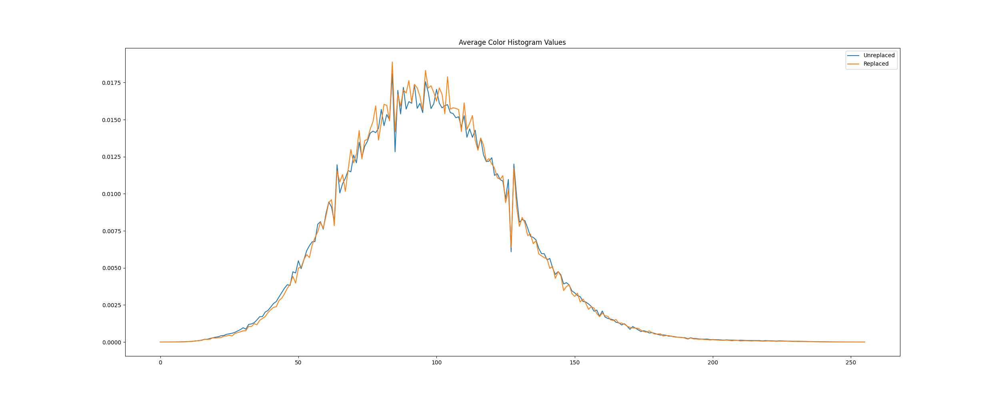

In [66]:
# un_mean = hist_un.mean(axis=0)
# re_mean = hist_re.mean(axis=0)

# # print(un_mean)

# print(un_mean[1:-1])
# print(re_mean[1:-1])

# fig, ax = plt.subplots(1, 1, figsize=figsize)
# ax.plot(un_mean[1:-1].to_numpy(), label="Unreplaced")
# ax.plot(re_mean[1:-1].to_numpy(), label="Replaced")
# ax.legend()
# ax.set_title("Average Color Histogram Values")

In [4]:
# unreplaced = rgb2gray(unreplaced_18_2)
# replaced = rgb2gray(replaced_18_2)

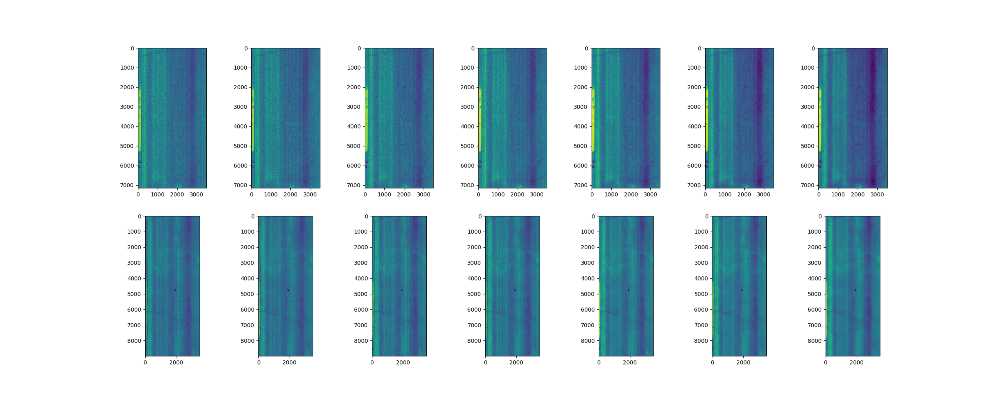

In [6]:
# f, ax = plt.subplots(2, 7, figsize=(25,10))

# ax[0,0].imshow(unreplaced)
# ax[0,1].imshow(gaussian(unreplaced, sigma=1))
# ax[0,2].imshow(gaussian(unreplaced, sigma=5))
# ax[0,3].imshow(gaussian(unreplaced, sigma=10))
# ax[0,4].imshow(gaussian(unreplaced, sigma=15))
# ax[0,5].imshow(gaussian(unreplaced, sigma=20))
# ax[0,6].imshow(gaussian(unreplaced, sigma=25))

# ax[1,0].imshow(replaced)
# ax[1,1].imshow(gaussian(replaced, sigma=1))
# ax[1,2].imshow(gaussian(replaced, sigma=5))
# ax[1,3].imshow(gaussian(replaced, sigma=10))
# ax[1,4].imshow(gaussian(replaced, sigma=15))
# ax[1,5].imshow(gaussian(replaced, sigma=20))
# ax[1,6].imshow(gaussian(replaced, sigma=25))